# Google Notebook specific Stuff

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
!pip install pytorch-lightning==1.3.3
# !pip install cloud-tpu-client==0.10 https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.8.1-cp37-cp37m-linux_x86_64.whl
!pip install scGeneFit
!pip install scanpy
!pip install anndata
# my version of smashpy that fixed imports, nothing else was changed
!pip install matplotlib>=3.3.2
!pip install shap>=0.37.0
!pip install xgboost>=1.3.3
!pip install imbalanced-learn>=0.7.0
!pip install numba>=0.51.2
!pip install harmonypy>=0.0.5
!git clone https://github.com/beelze-b/SmashFork.git
!git clone https://github.com/ahsv/RankCorr.git

fatal: destination path 'SmashFork' already exists and is not an empty directory.
fatal: destination path 'RankCorr' already exists and is not an empty directory.


In [ ]:
# Check GPU

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sat Jul 17 19:05:47 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    24W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import sys
import os
# to import utils
sys.path.append(os.path.abspath('/content/gdrive/My Drive/Differentiable-Sparse-Subset-Selection/notebooks'))

# All the Imports

In [ ]:
%%time 
import itertools 
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.preprocessing import LabelEncoder


from RankCorr.picturedRocks import Rocks
import SmashFork.smashpy as smashpy


import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import functional as F

from utils import *


/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.ensemble.bagging module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part o

CPU times: user 16.6 s, sys: 873 ms, total: 17.5 s
Wall time: 18.9 s


# These should be parameters later on 

In [ ]:
z_size = 16
hidden_layer_size = 256

# really good results for vanilla VAE on synthetic data with EPOCHS set to 50, 
# but when running locally set to 10 for reasonable run times
batch_size = 64
batch_norm = True


global_t = 3.0

k_range = [10, 50, 100, 250]
k = 50
num_times = 5

gpus = 1
tpu_cores = None

In [ ]:
import multiprocessing

num_cores = multiprocessing.cpu_count()

# Here goes all the stuff that we change from dataset to dataset

In [ ]:
from os import path

In [ ]:
dataset_dir = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/zeisel/'
model_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/zeisel/models/'
viz_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/zeisel/visualizations/'

if not path.exists(model_save_path):
  os.mkdir(model_save_path)

if not path.exists(model_save_path + 'experiment_data_folds/'):
  os.mkdir(model_save_path + 'experiment_data_folds/')
  
if not path.exists(viz_save_path):
  os.mkdir(viz_save_path)

  

# Dataset Specific Processing

`

In [ ]:
adata = sc.read_h5ad(dataset_dir + "Zeisel.h5ad")

In [ ]:
adata.obs

,names0,names1,labels0,labels1
0,interneurons,Int10,3,12
1,interneurons,Int10,3,12
2,interneurons,Int6,3,23
3,interneurons,Int10,3,12
4,interneurons,Int9,3,26
...,...,...,...,...
3000,endothelial-mural,Peric,2,35
3001,endothelial-mural,Vsmc,2,48
3002,endothelial-mural,Vsmc,2,48
3003,endothelial-mural,Vsmc,2,48


In [ ]:
adata.shape

(3005, 4000)

In [ ]:
np.apply_along_axis(np.mean, 0, adata.X)

array([5.07780e-09, 4.06224e-08, 0.00000e+00, ..., 4.06224e-08,
       3.04668e-08, 0.00000e+00], dtype=float32)

In [ ]:
np.apply_along_axis(np.var, 0, adata.X)

array([0.9996673, 0.9996672, 0.9996674, ..., 0.9996672, 0.9996674,
       0.9996673], dtype=float32)

In [ ]:
X = adata.X.copy()
adata.obs['names']=adata.obs['names0']
adata.obs['annotation'] = adata.obs['names0']
labels = adata.obs['names0'].values
encoder = LabelEncoder()
encoder.fit(labels)
y = encoder.transform(labels)

In [ ]:
input_size = X.shape[1]
y

array([2, 2, 2, ..., 1, 1, 1])

In [ ]:
# Disable
def blockPrint():
    sys.stdout = open(os.devnull, 'w')

# Restore
def enablePrint():
    sys.stdout = sys.__stdout__

In [ ]:

import utils_soledad 
from importlib import reload  
reload(utils_soledad)
from utils_soledad import *

error_rates=[0] # 0.1, 0.2, 0.3, 0.4, 0.5]
methods=["l1_vae", "random", "runningstate", "rankcorr"] #, "smash_rf", "smash_DNN",  "runningstate_vae", "concrete_vae", "globalgate"]
accuracy=np.zeros((len(methods), len(error_rates)))

X = adata.X.copy()
y = y.copy()
train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers=num_cores, batch_size = batch_size)
X_train = X[np.concatenate([train_indices, val_indices]), :]
y_train = y[np.concatenate([train_indices, val_indices])]
X_test = X[test_indices,:]
y_test = y[test_indices]

for j in range(len(error_rates)):
    data = noisy_adata(adata, error_rates[j])
    for i in range(len(methods)):
        if accuracy[i,j]==0:
            markers = get_markers(data, 25, method=methods[i], params={})
            results = new_model_metrics(X_train, y_train, X_test, y_test, markers)
            accuracy[i,j]=results[1]["accuracy"]
        print("********",i,j, accuracy[i,j])

accuracy

In [ ]:
accuracy

# Set Up Models

## Train Smash Random Forest





In [ ]:
print(accuracy)

In [ ]:
# needed for random forest Smash
!mkdir Figures

 * Initialising ...

Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

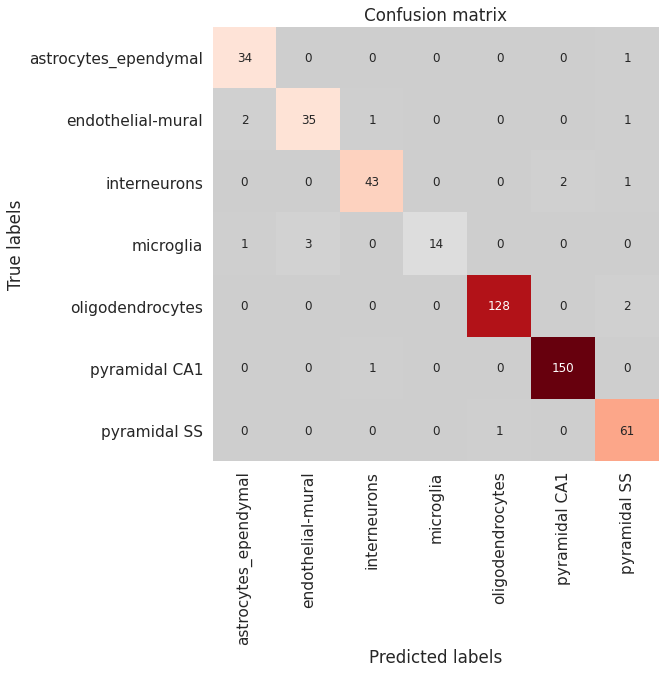

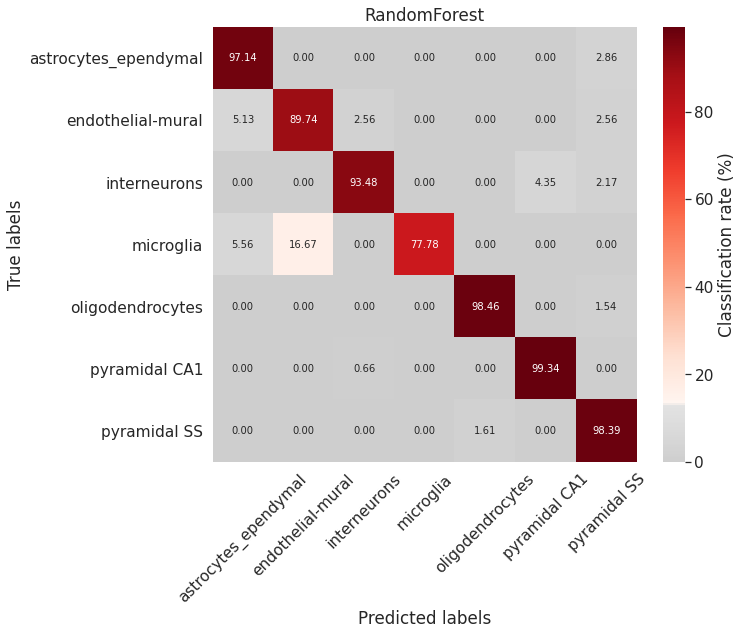

Accuracy: 0.9667359667359667: Misclassification: 0.033264033264033266
                      precision    recall  f1-score   support

astrocytes_ependymal       0.92      0.97      0.94        35
   endothelial-mural       0.92      0.90      0.91        39
        interneurons       0.96      0.93      0.95        46
           microglia       1.00      0.78      0.88        18
    oligodendrocytes       0.99      0.98      0.99       130
       pyramidal CA1       0.99      0.99      0.99       151
        pyramidal SS       0.92      0.98      0.95        62

            accuracy                           0.97       481
           macro avg       0.96      0.93      0.94       481
        weighted avg       0.97      0.97      0.97       481



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



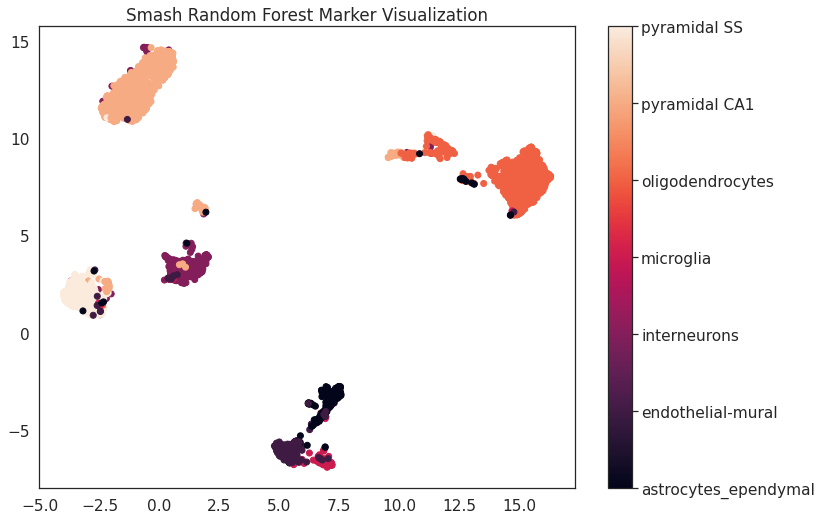

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

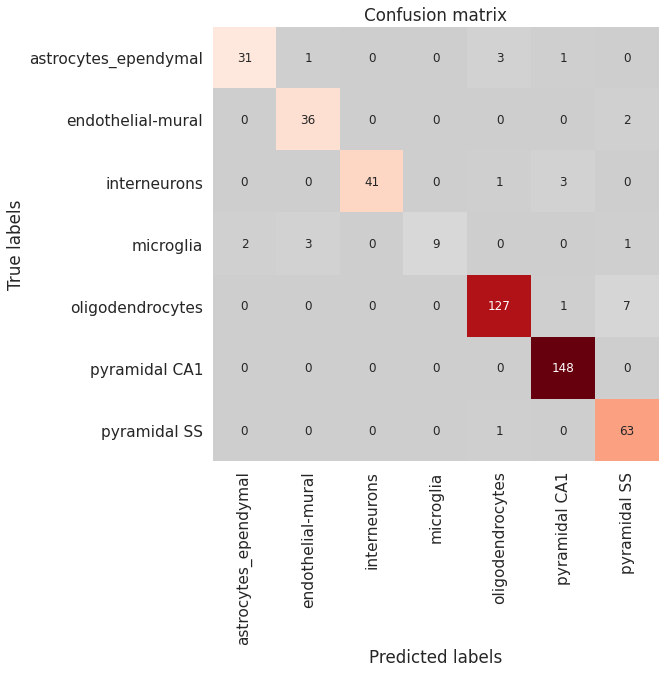

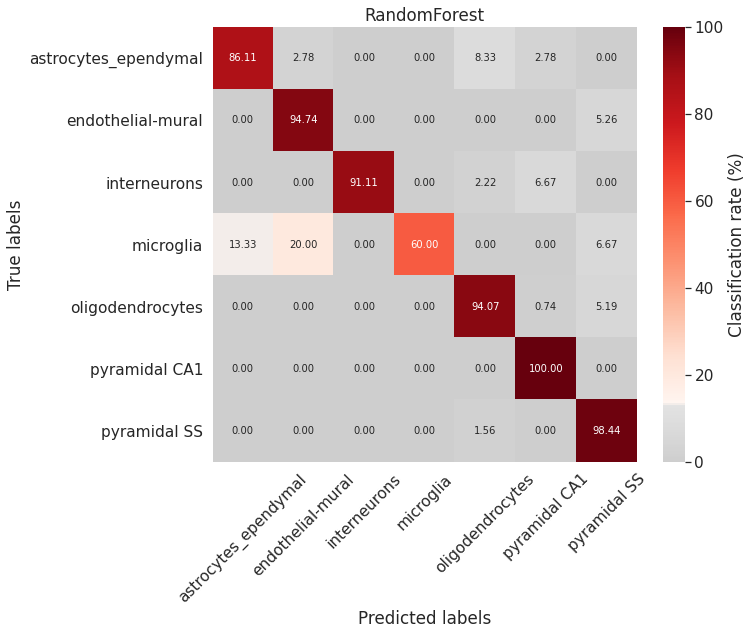

Accuracy: 0.9459459459459459: Misclassification: 0.05405405405405406
                      precision    recall  f1-score   support

astrocytes_ependymal       0.94      0.86      0.90        36
   endothelial-mural       0.90      0.95      0.92        38
        interneurons       1.00      0.91      0.95        45
           microglia       1.00      0.60      0.75        15
    oligodendrocytes       0.96      0.94      0.95       135
       pyramidal CA1       0.97      1.00      0.98       148
        pyramidal SS       0.86      0.98      0.92        64

            accuracy                           0.95       481
           macro avg       0.95      0.89      0.91       481
        weighted avg       0.95      0.95      0.94       481



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



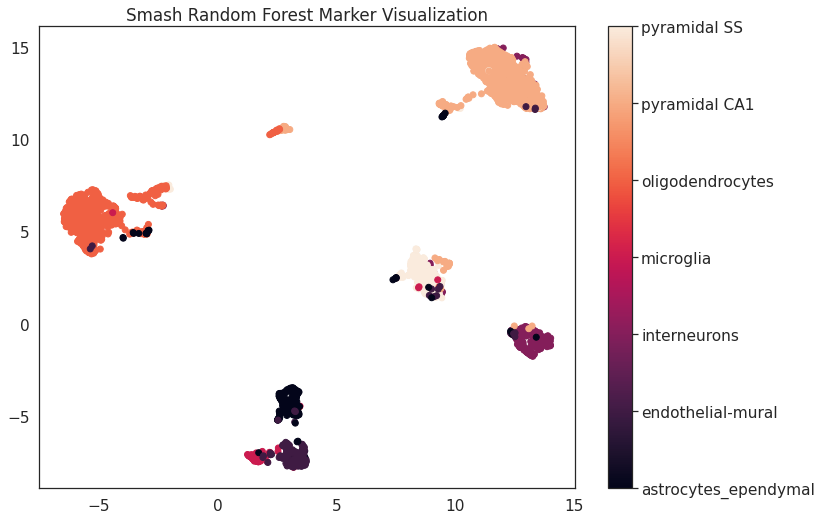

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

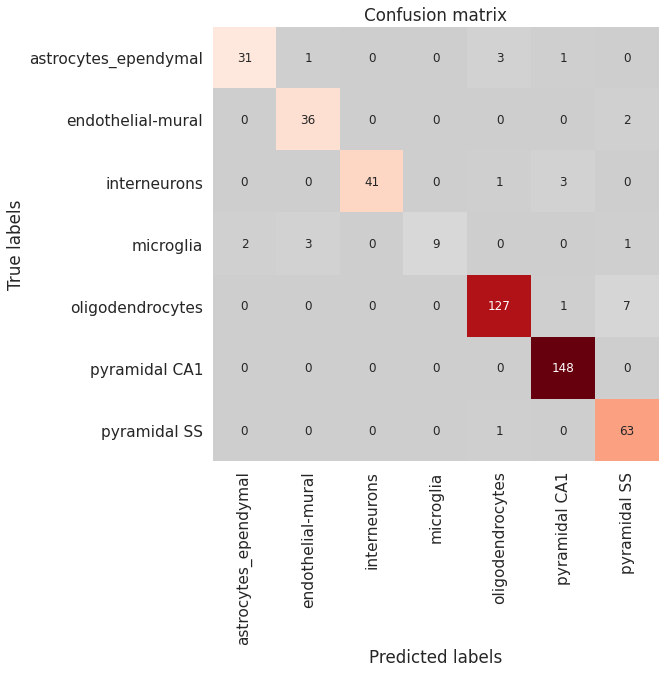

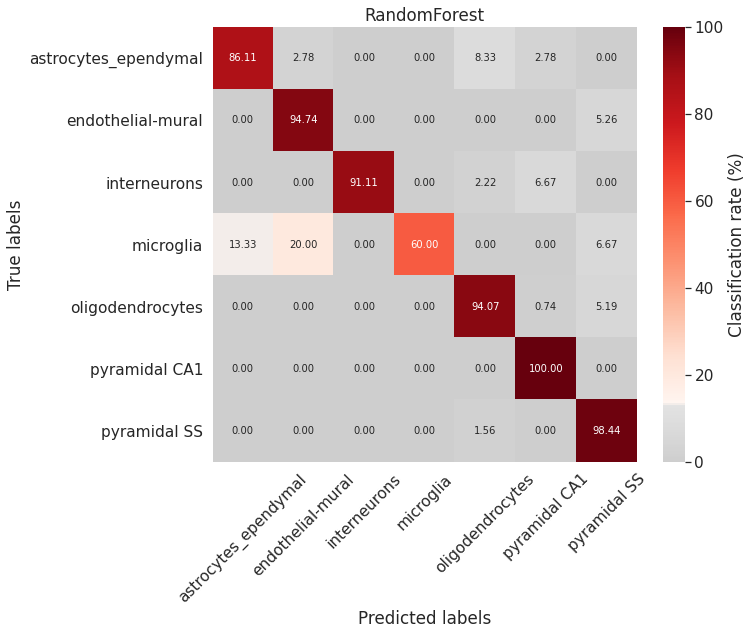

Accuracy: 0.9459459459459459: Misclassification: 0.05405405405405406
                      precision    recall  f1-score   support

astrocytes_ependymal       0.94      0.86      0.90        36
   endothelial-mural       0.90      0.95      0.92        38
        interneurons       1.00      0.91      0.95        45
           microglia       1.00      0.60      0.75        15
    oligodendrocytes       0.96      0.94      0.95       135
       pyramidal CA1       0.97      1.00      0.98       148
        pyramidal SS       0.86      0.98      0.92        64

            accuracy                           0.95       481
           macro avg       0.95      0.89      0.91       481
        weighted avg       0.95      0.95      0.94       481



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



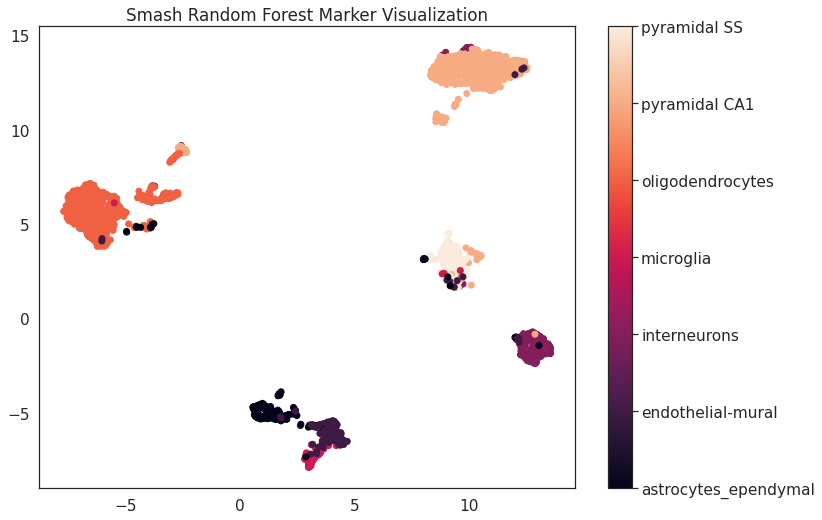

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

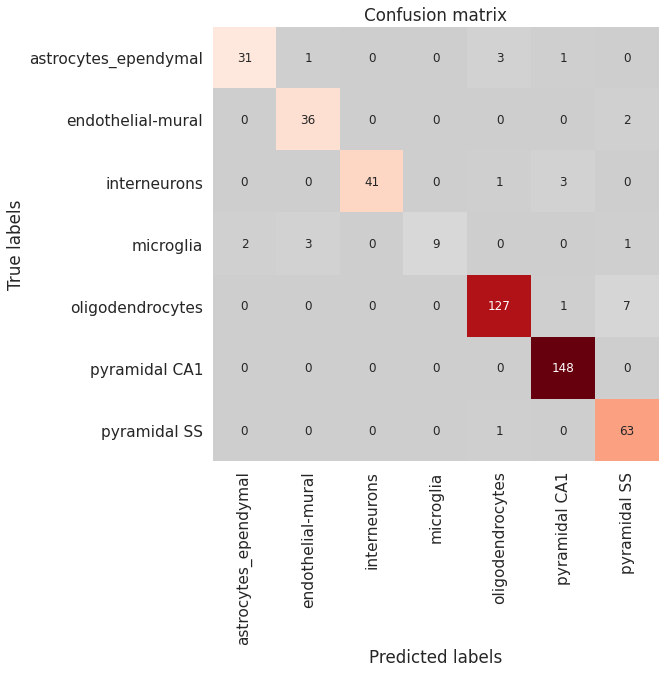

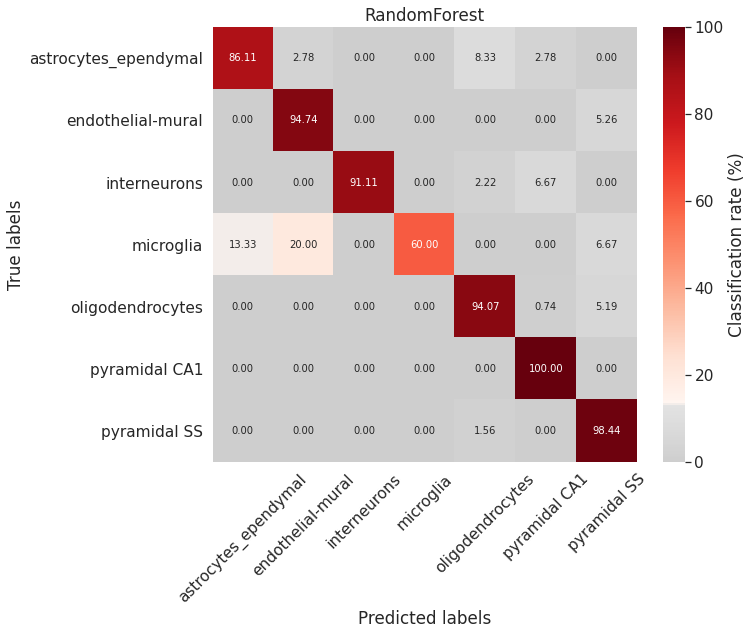

Accuracy: 0.9459459459459459: Misclassification: 0.05405405405405406
                      precision    recall  f1-score   support

astrocytes_ependymal       0.94      0.86      0.90        36
   endothelial-mural       0.90      0.95      0.92        38
        interneurons       1.00      0.91      0.95        45
           microglia       1.00      0.60      0.75        15
    oligodendrocytes       0.96      0.94      0.95       135
       pyramidal CA1       0.97      1.00      0.98       148
        pyramidal SS       0.86      0.98      0.92        64

            accuracy                           0.95       481
           macro avg       0.95      0.89      0.91       481
        weighted avg       0.95      0.95      0.94       481



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



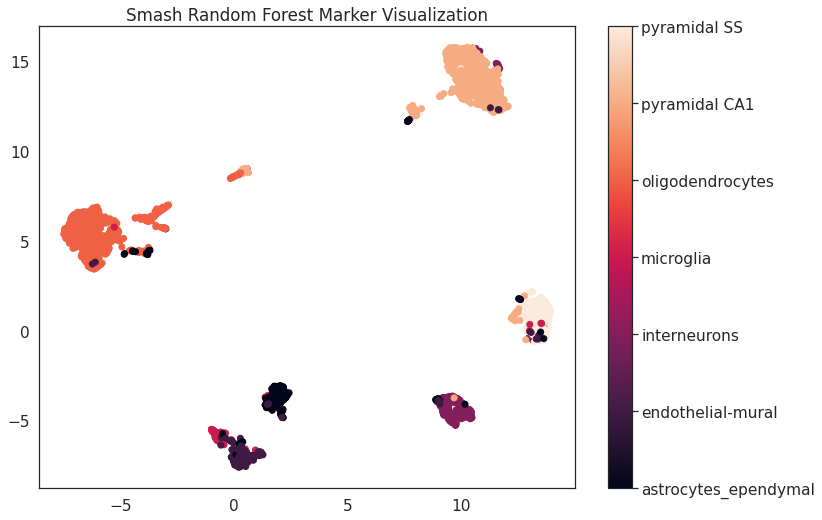

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

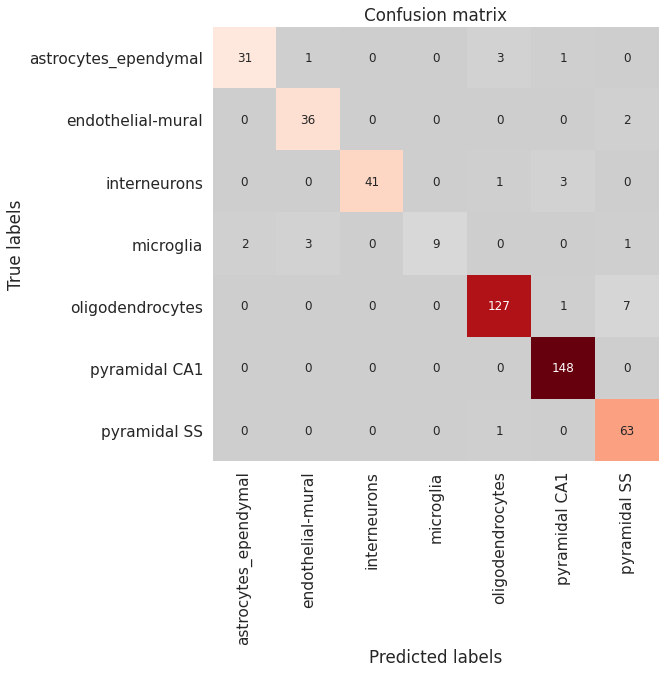

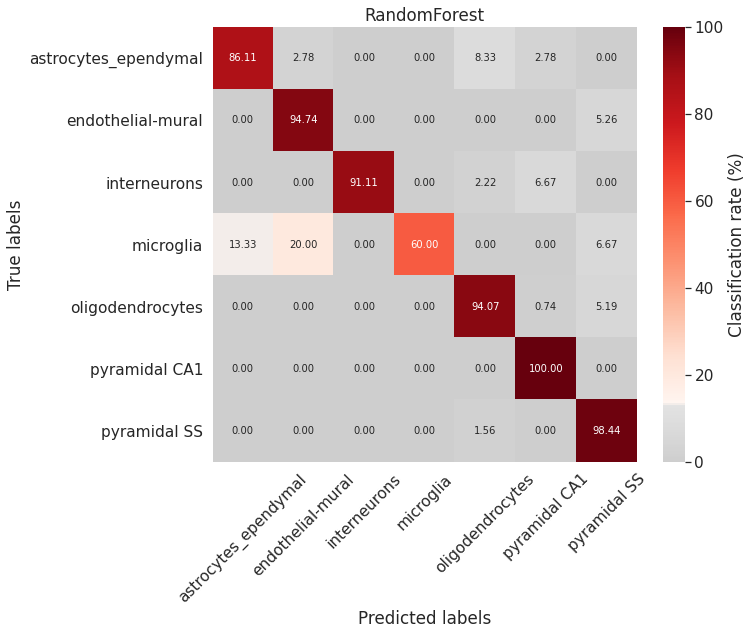

Accuracy: 0.9459459459459459: Misclassification: 0.05405405405405406
                      precision    recall  f1-score   support

astrocytes_ependymal       0.94      0.86      0.90        36
   endothelial-mural       0.90      0.95      0.92        38
        interneurons       1.00      0.91      0.95        45
           microglia       1.00      0.60      0.75        15
    oligodendrocytes       0.96      0.94      0.95       135
       pyramidal CA1       0.97      1.00      0.98       148
        pyramidal SS       0.86      0.98      0.92        64

            accuracy                           0.95       481
           macro avg       0.95      0.89      0.91       481
        weighted avg       0.95      0.95      0.94       481



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



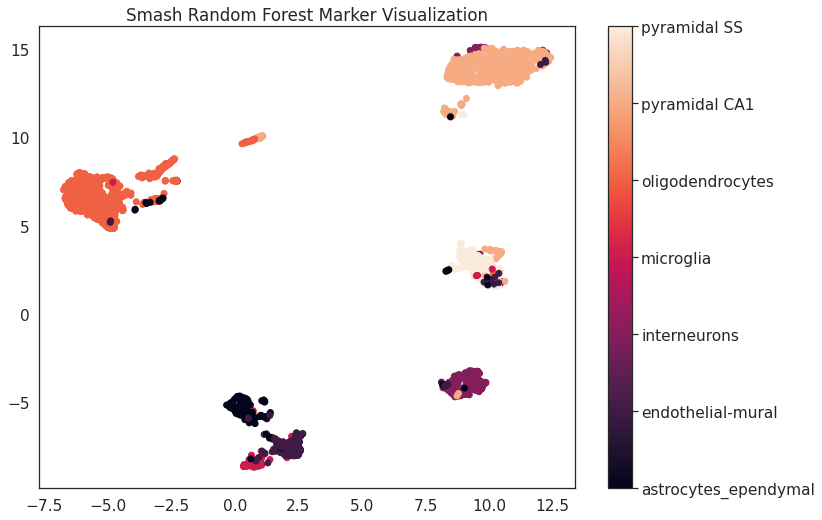

CPU times: user 2min 14s, sys: 6.61 s, total: 2min 21s
Wall time: 1min 37s


In [ ]:
%%time
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    train_X_y = adata[np.concatenate([train_indices, val_indices]), :]
    sm = smashpy.smashpy()
    clf = sm.ensemble_learning(train_X_y, group_by="annotation", classifier="RandomForest", balance=True, verbose=True)
    selectedGenes, selectedGenes_dict = sm.gini_importance(train_X_y, clf, group_by="annotation", verbose=True, restrict_top=("global", k))
    # since this selects k per class, need select randomly from each classes
    smash_markers = adata.var.index.get_indexer(selectedGenes)

    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = smash_markers)
    np.save(model_save_path + 'smash_rf_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'smash_rf_markers_{}.npy'.format(tryy), smash_markers)
    np.save(model_save_path + 'experiment_data_folds/smash_rf_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Smash Random Forest Marker Visualization', path = viz_save_path + 'smash_rf_markers_{}.png'.format(tryy), markers = smash_markers)

In [ ]:
results

(0.0532445923460898,
 {'0': {'f1-score': 0.9069767441860465,
   'precision': 0.9512195121951219,
   'recall': 0.8666666666666667,
   'support': 45},
  '1': {'f1-score': 0.924731182795699,
   'precision': 0.9555555555555556,
   'recall': 0.8958333333333334,
   'support': 48},
  '2': {'f1-score': 0.8760330578512396,
   'precision': 0.9298245614035088,
   'recall': 0.828125,
   'support': 64},
  '3': {'f1-score': 0.9268292682926829,
   'precision': 1.0,
   'recall': 0.8636363636363636,
   'support': 22},
  '4': {'f1-score': 0.9727891156462585,
   'precision': 0.959731543624161,
   'recall': 0.9862068965517241,
   'support': 145},
  '5': {'f1-score': 0.9702970297029703,
   'precision': 0.9514563106796117,
   'recall': 0.98989898989899,
   'support': 198},
  '6': {'f1-score': 0.9325153374233128,
   'precision': 0.9047619047619048,
   'recall': 0.9620253164556962,
   'support': 79},
  'accuracy': 0.9467554076539102,
  'macro avg': {'f1-score': 0.9300245336997442,
   'precision': 0.9503641983

## Train Smash DNN

the data is treated a bit differently than our other models

 * Initialising ...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                128032    
_________________________________________________________________
batch_normalization (BatchNo (None, 32)                128       
_________________________________________________________________
activation (Activation)      (None, 32)                0         
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 16)                528       
_________________________________________________________________
batch_normalization_1 (Batch (None, 16)                64        
_________________________________________________________________
activation_1 (Activation)    (None, 

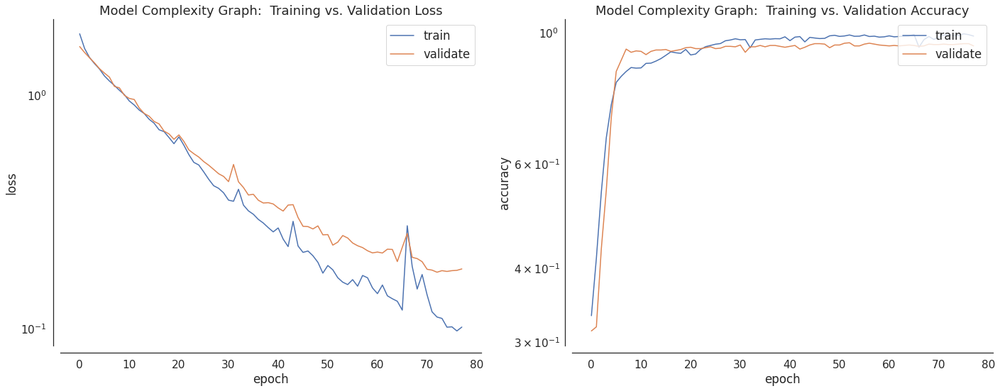

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

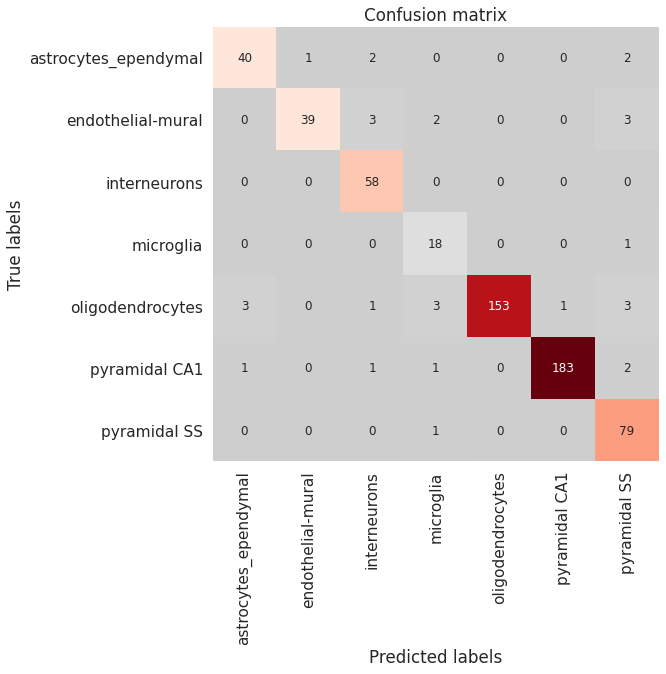

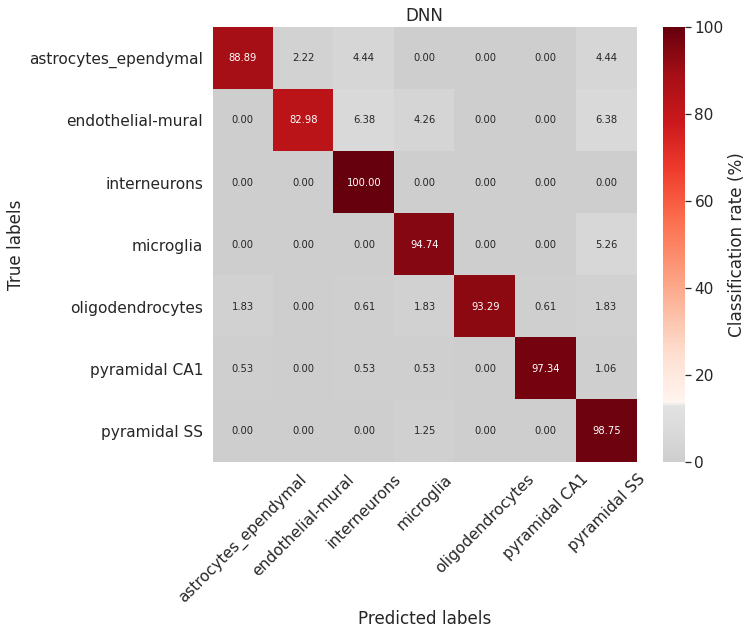

                      precision    recall  f1-score   support

astrocytes_ependymal       0.91      0.89      0.90        45
   endothelial-mural       0.97      0.83      0.90        47
        interneurons       0.89      1.00      0.94        58
           microglia       0.72      0.95      0.82        19
    oligodendrocytes       1.00      0.93      0.97       164
       pyramidal CA1       0.99      0.97      0.98       188
        pyramidal SS       0.88      0.99      0.93        80

            accuracy                           0.95       601
           macro avg       0.91      0.94      0.92       601
        weighted avg       0.95      0.95      0.95       601

19/19 [==============================] - 0s 5ms/step - loss: 0.1739 - accuracy: 0.9534 - auc: 0.9974 - precision: 0.9708 - recall: 0.9401


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:91: UserWarning:

keras is no longer supported, please use tf.keras instead.

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



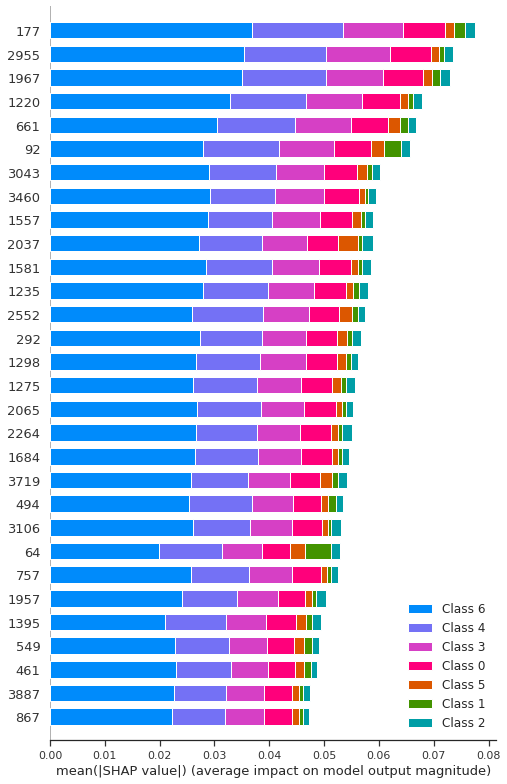

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



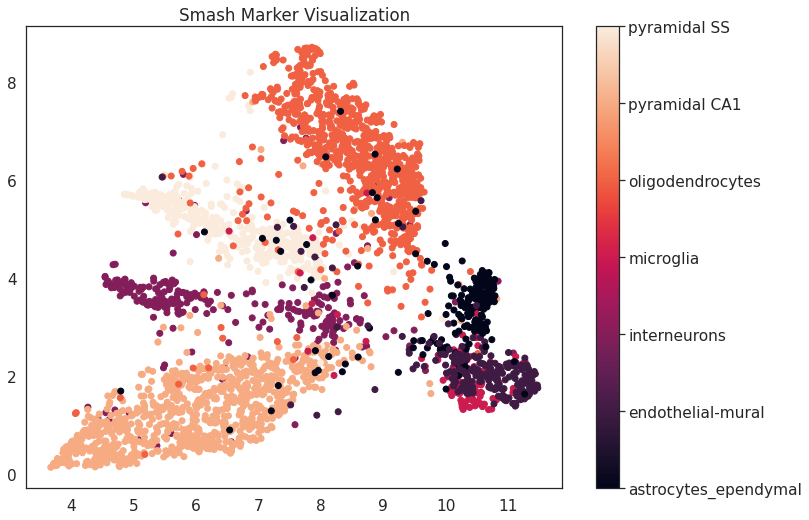

 * Initialising ...
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 32)                128032    
_________________________________________________________________
batch_normalization_4 (Batch (None, 32)                128       
_________________________________________________________________
activation_4 (Activation)    (None, 32)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 16)                528       
_________________________________________________________________
batch_normalization_5 (Batch (None, 16)                64        
_________________________________________________________________
activation_5 (Activation)    (None

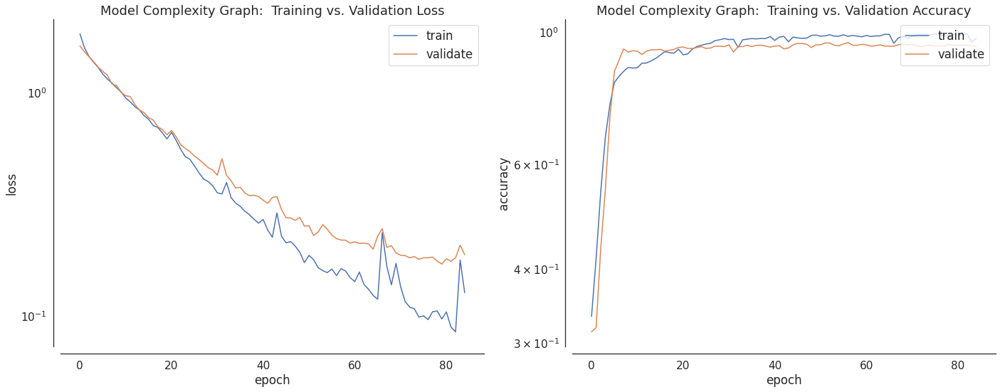

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

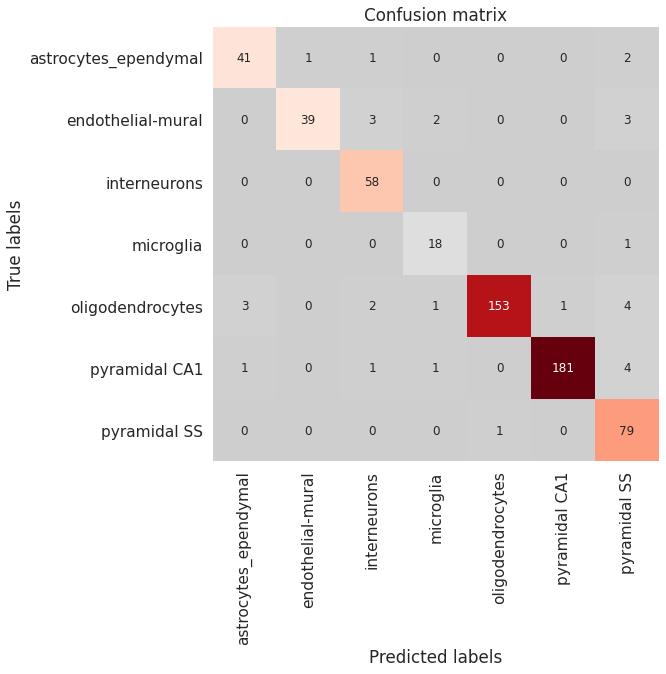

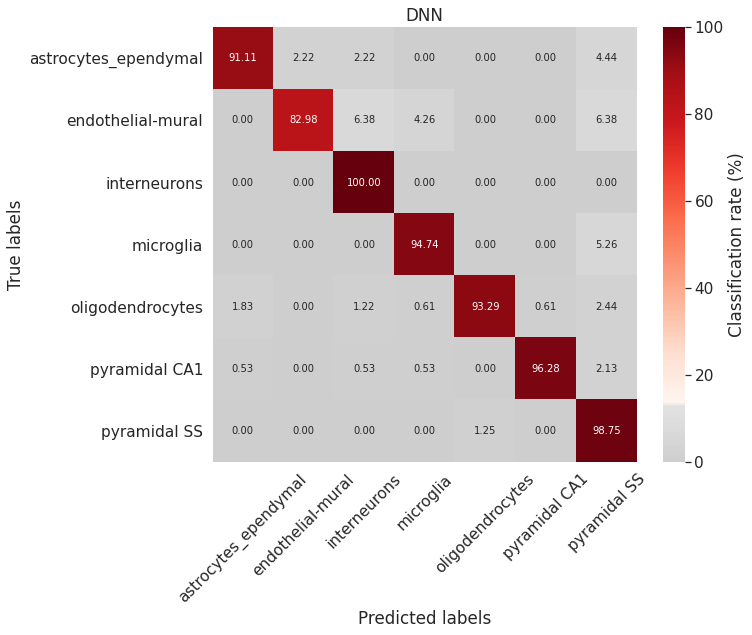

                      precision    recall  f1-score   support

astrocytes_ependymal       0.91      0.91      0.91        45
   endothelial-mural       0.97      0.83      0.90        47
        interneurons       0.89      1.00      0.94        58
           microglia       0.82      0.95      0.88        19
    oligodendrocytes       0.99      0.93      0.96       164
       pyramidal CA1       0.99      0.96      0.98       188
        pyramidal SS       0.85      0.99      0.91        80

            accuracy                           0.95       601
           macro avg       0.92      0.94      0.93       601
        weighted avg       0.95      0.95      0.95       601

19/19 [==============================] - 0s 4ms/step - loss: 0.1698 - accuracy: 0.9501 - auc: 0.9973 - precision: 0.9642 - recall: 0.9418


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



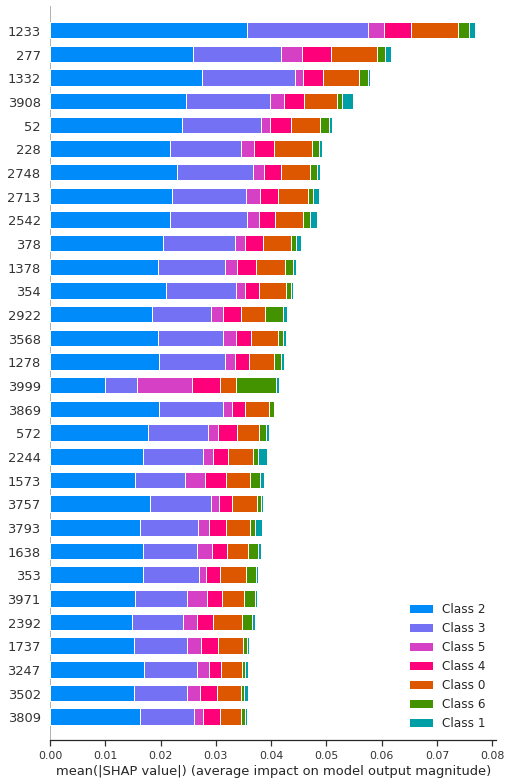

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



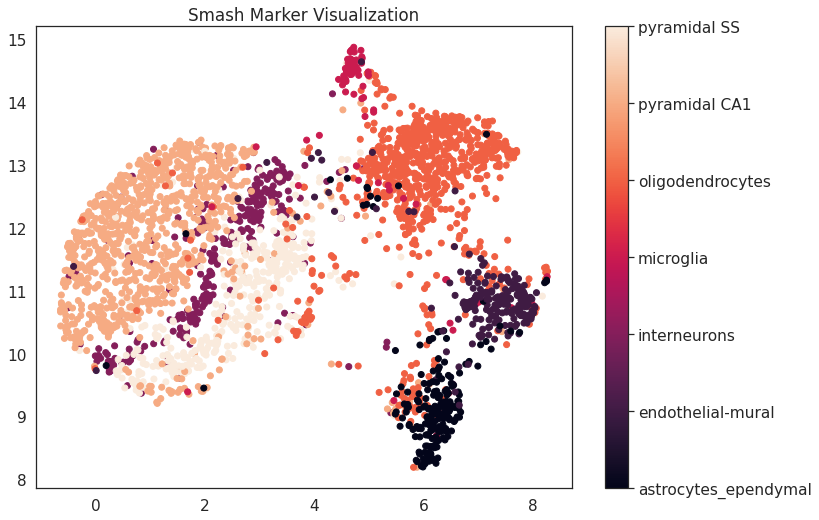

 * Initialising ...
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 32)                128032    
_________________________________________________________________
batch_normalization_8 (Batch (None, 32)                128       
_________________________________________________________________
activation_8 (Activation)    (None, 32)                0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_9 (Batch (None, 16)                64        
_________________________________________________________________
activation_9 (Activation)    (None

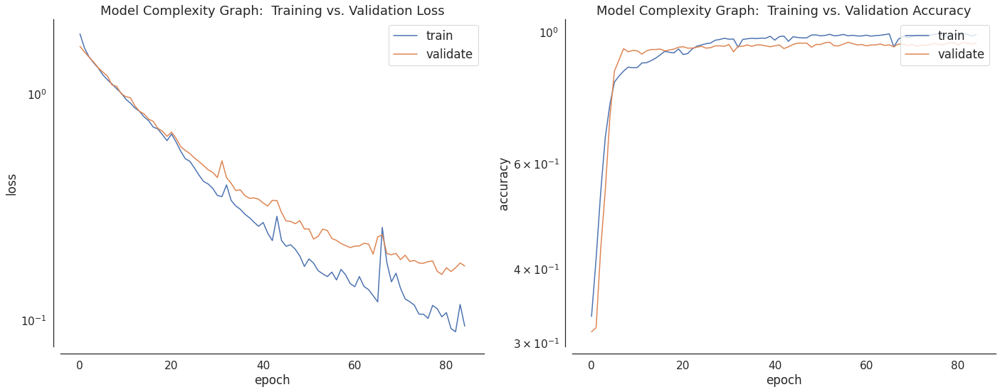

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

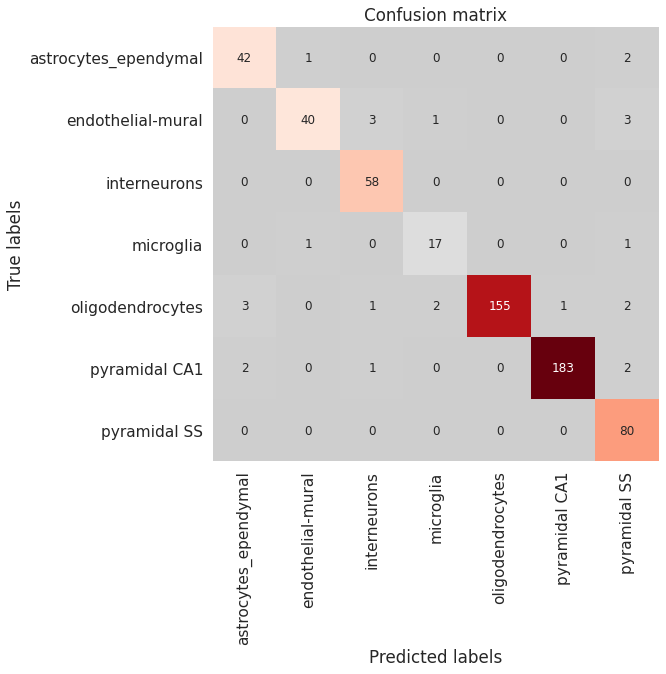

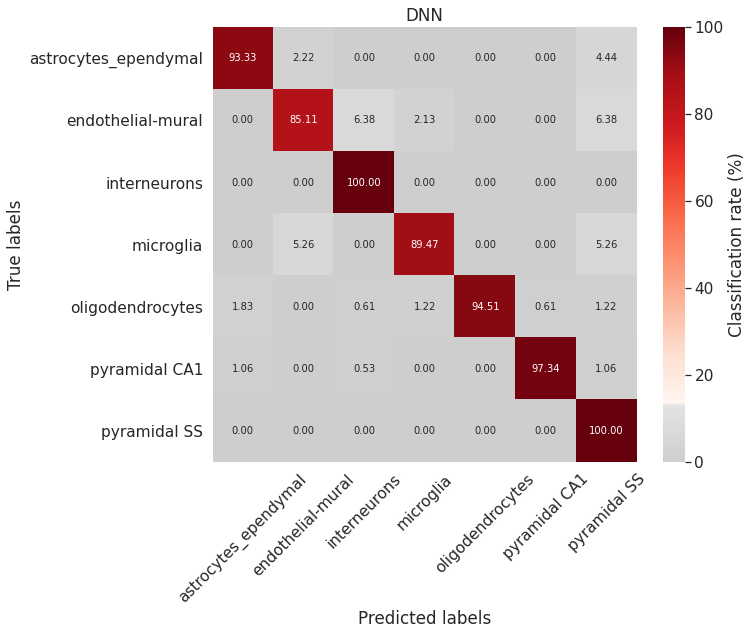

                      precision    recall  f1-score   support

astrocytes_ependymal       0.89      0.93      0.91        45
   endothelial-mural       0.95      0.85      0.90        47
        interneurons       0.92      1.00      0.96        58
           microglia       0.85      0.89      0.87        19
    oligodendrocytes       1.00      0.95      0.97       164
       pyramidal CA1       0.99      0.97      0.98       188
        pyramidal SS       0.89      1.00      0.94        80

            accuracy                           0.96       601
           macro avg       0.93      0.94      0.93       601
        weighted avg       0.96      0.96      0.96       601

19/19 [==============================] - 0s 5ms/step - loss: 0.1588 - accuracy: 0.9584 - auc: 0.9977 - precision: 0.9712 - recall: 0.9534


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



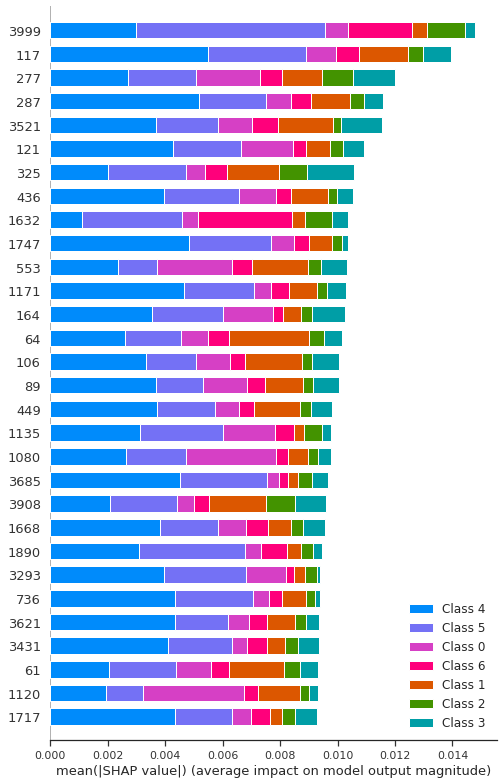

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



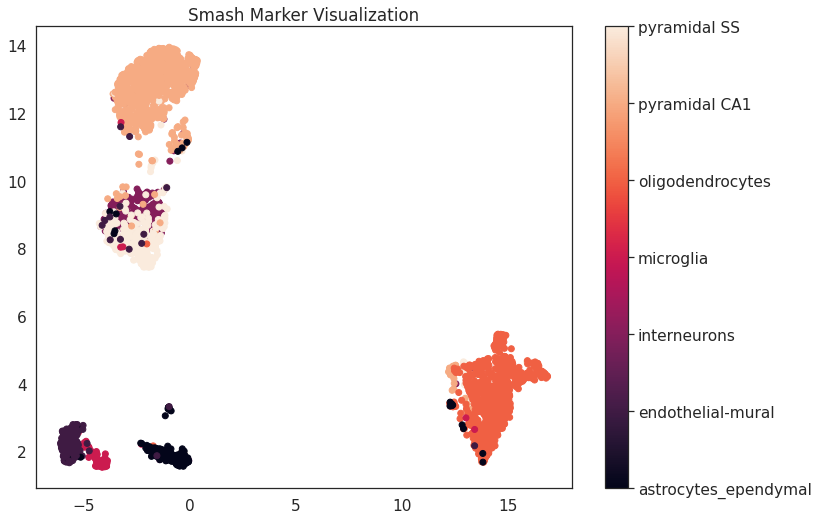

 * Initialising ...
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 32)                128032    
_________________________________________________________________
batch_normalization_12 (Batc (None, 32)                128       
_________________________________________________________________
activation_12 (Activation)   (None, 32)                0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_13 (Batc (None, 16)                64        
_________________________________________________________________
activation_13 (Activation)   (None

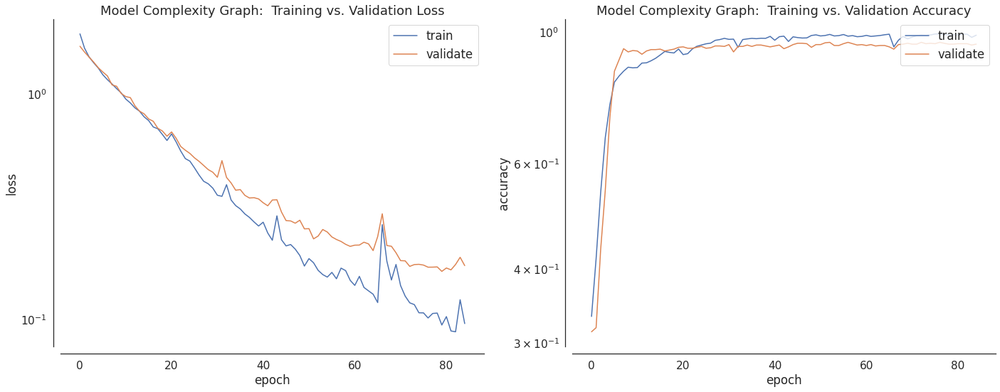

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

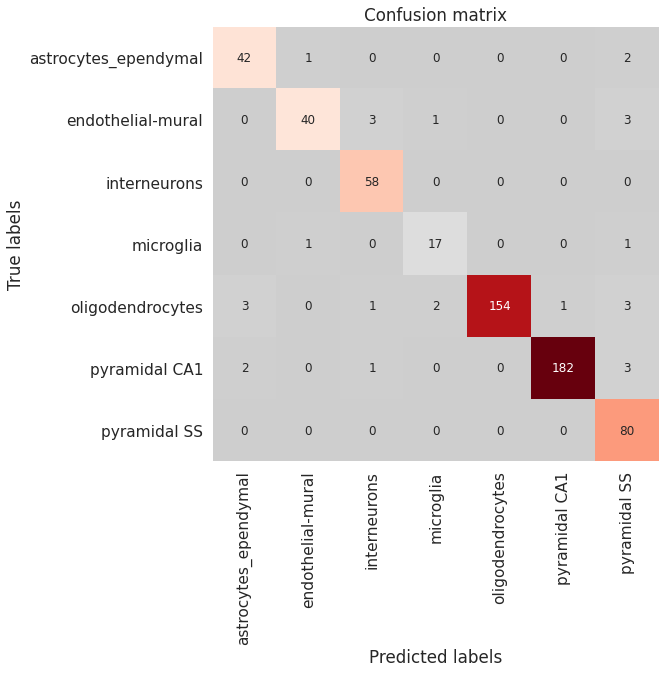

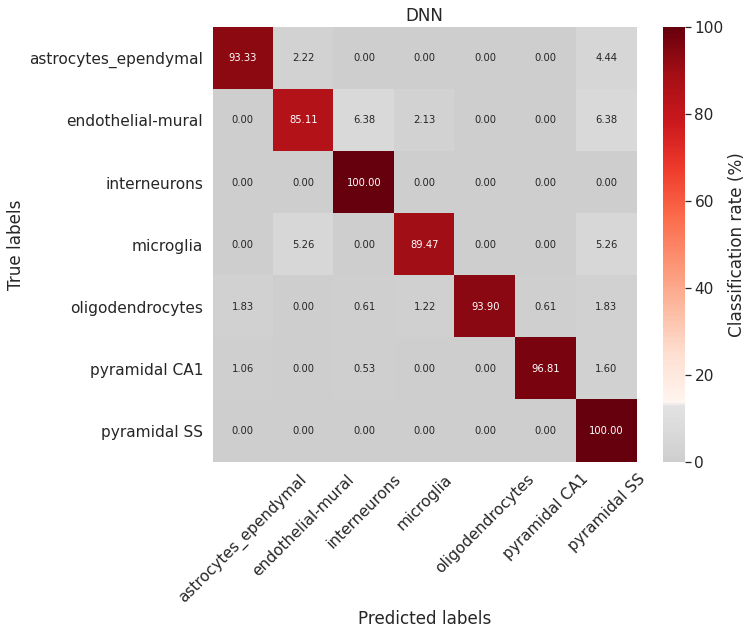

                      precision    recall  f1-score   support

astrocytes_ependymal       0.89      0.93      0.91        45
   endothelial-mural       0.95      0.85      0.90        47
        interneurons       0.92      1.00      0.96        58
           microglia       0.85      0.89      0.87        19
    oligodendrocytes       1.00      0.94      0.97       164
       pyramidal CA1       0.99      0.97      0.98       188
        pyramidal SS       0.87      1.00      0.93        80

            accuracy                           0.95       601
           macro avg       0.93      0.94      0.93       601
        weighted avg       0.96      0.95      0.95       601

19/19 [==============================] - 0s 5ms/step - loss: 0.1632 - accuracy: 0.9534 - auc: 0.9975 - precision: 0.9643 - recall: 0.9434


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



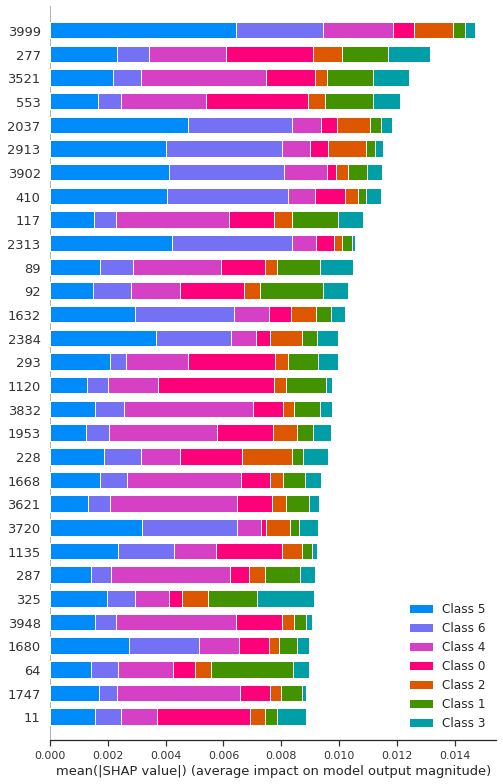

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



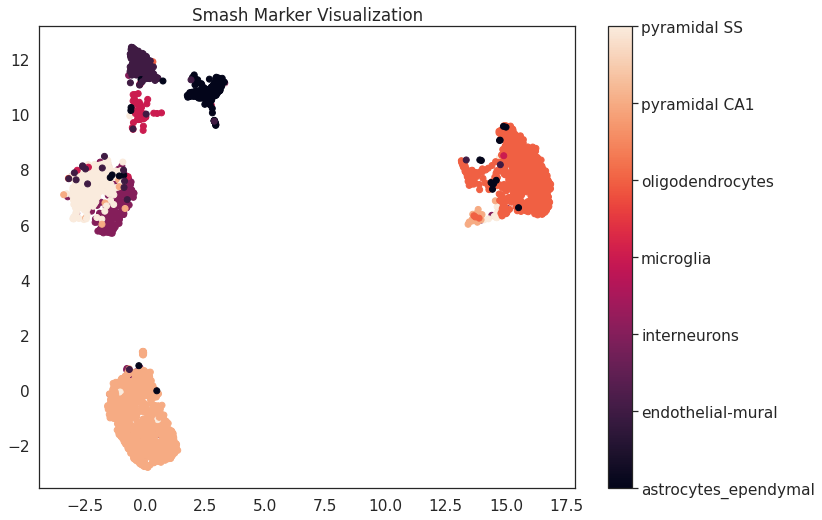

 * Initialising ...
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 32)                128032    
_________________________________________________________________
batch_normalization_16 (Batc (None, 32)                128       
_________________________________________________________________
activation_16 (Activation)   (None, 32)                0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_25 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_17 (Batc (None, 16)                64        
_________________________________________________________________
activation_17 (Activation)   (None

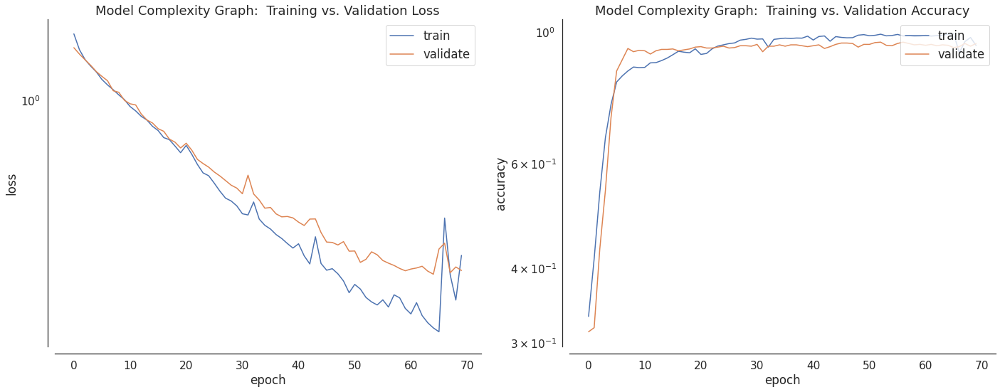

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

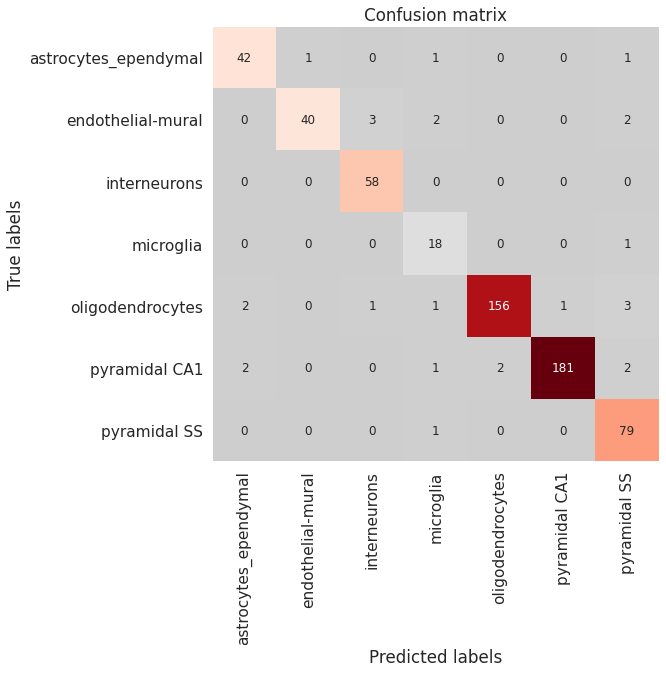

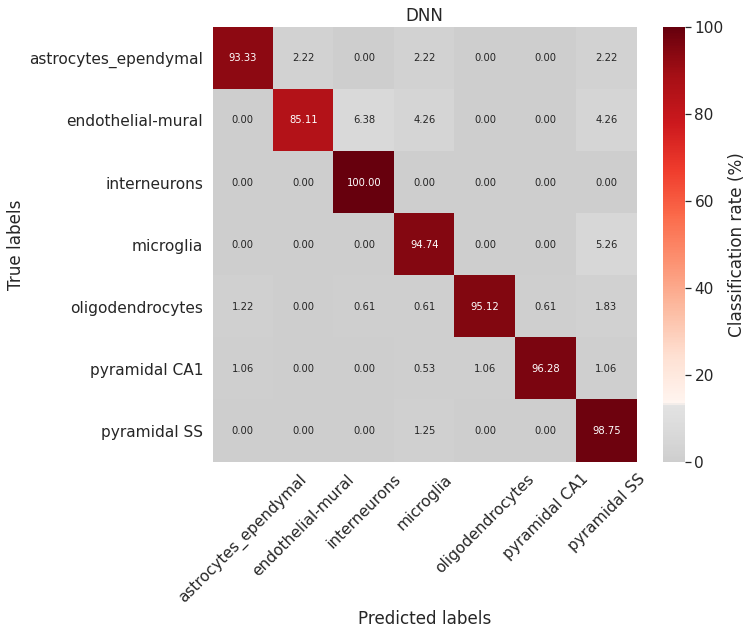

                      precision    recall  f1-score   support

astrocytes_ependymal       0.91      0.93      0.92        45
   endothelial-mural       0.98      0.85      0.91        47
        interneurons       0.94      1.00      0.97        58
           microglia       0.75      0.95      0.84        19
    oligodendrocytes       0.99      0.95      0.97       164
       pyramidal CA1       0.99      0.96      0.98       188
        pyramidal SS       0.90      0.99      0.94        80

            accuracy                           0.96       601
           macro avg       0.92      0.95      0.93       601
        weighted avg       0.96      0.96      0.96       601

19/19 [==============================] - 0s 6ms/step - loss: 0.2040 - accuracy: 0.9484 - auc: 0.9967 - precision: 0.9659 - recall: 0.9434


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



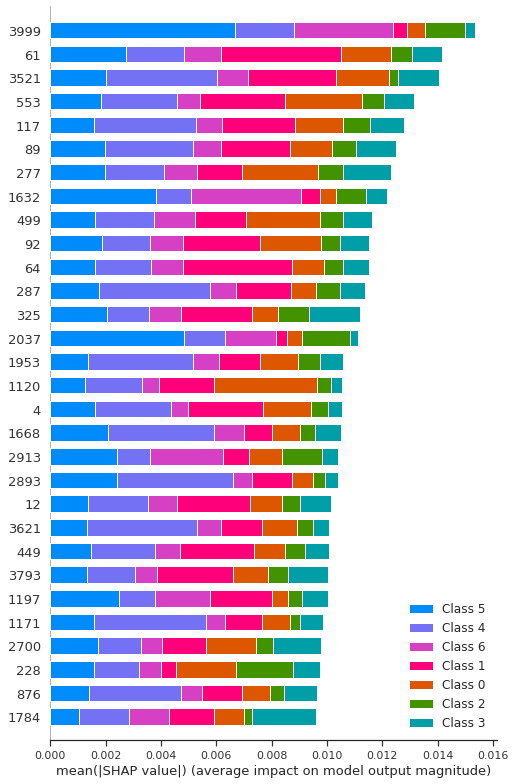

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



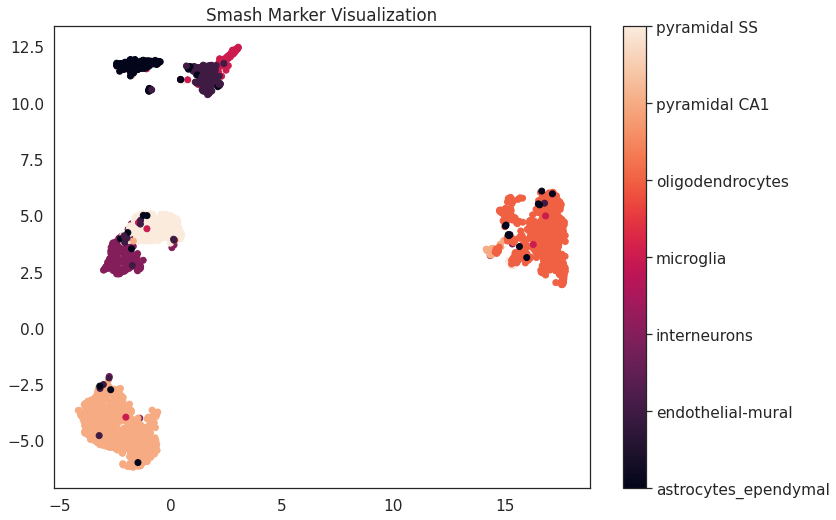

CPU times: user 6min 10s, sys: 40.4 s, total: 6min 50s
Wall time: 4min 54s


In [ ]:
%%time
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    train_X_y = adata[np.concatenate([train_indices, val_indices]), :]
    sm = smashpy.smashpy()
    sm.DNN(adata, group_by="annotation", model=None, balance=True, verbose=True, save=False)
    selectedGenes, selectedGenes_dict = sm.run_shap(adata, group_by="annotation", model=None, verbose=True, pct=0.1, restrict_top=("global", k))
    # since this selects k per class, need select randomly from each classes
    smash_markers = adata.var.index.get_indexer(selectedGenes)

    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = smash_markers)
    np.save(model_save_path + 'smash_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'smash_markers_{}.npy'.format(tryy), smash_markers)
    np.save(model_save_path + 'experiment_data_folds/smash_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Smash Marker Visualization', path = viz_save_path + 'smash_markers_{}.png'.format(tryy), markers = smash_markers)

In [ ]:
results

(0.048252911813643884,
 {'0': {'f1-score': 0.891566265060241,
   'precision': 0.9736842105263158,
   'recall': 0.8222222222222222,
   'support': 45},
  '1': {'f1-score': 0.9473684210526315,
   'precision': 0.9574468085106383,
   'recall': 0.9375,
   'support': 48},
  '2': {'f1-score': 0.9105691056910569,
   'precision': 0.9491525423728814,
   'recall': 0.875,
   'support': 64},
  '3': {'f1-score': 0.9268292682926829,
   'precision': 1.0,
   'recall': 0.8636363636363636,
   'support': 22},
  '4': {'f1-score': 0.9797297297297297,
   'precision': 0.9602649006622517,
   'recall': 1.0,
   'support': 145},
  '5': {'f1-score': 0.967741935483871,
   'precision': 0.9512195121951219,
   'recall': 0.9848484848484849,
   'support': 198},
  '6': {'f1-score': 0.9316770186335404,
   'precision': 0.9146341463414634,
   'recall': 0.9493670886075949,
   'support': 79},
  'accuracy': 0.9517470881863561,
  'macro avg': {'f1-score': 0.9364973919919647,
   'precision': 0.958057445801239,
   'recall': 0.9189

## Train RankCorr

Excess Length of markers
52


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



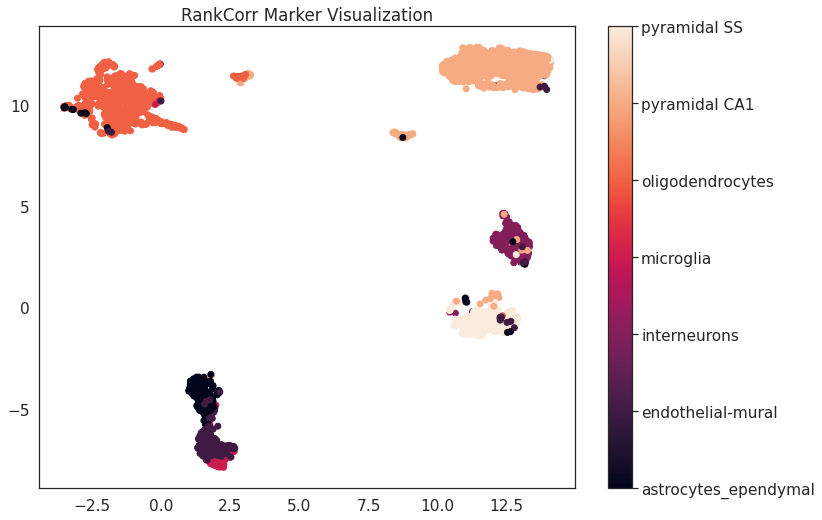

Excess Length of markers
54


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



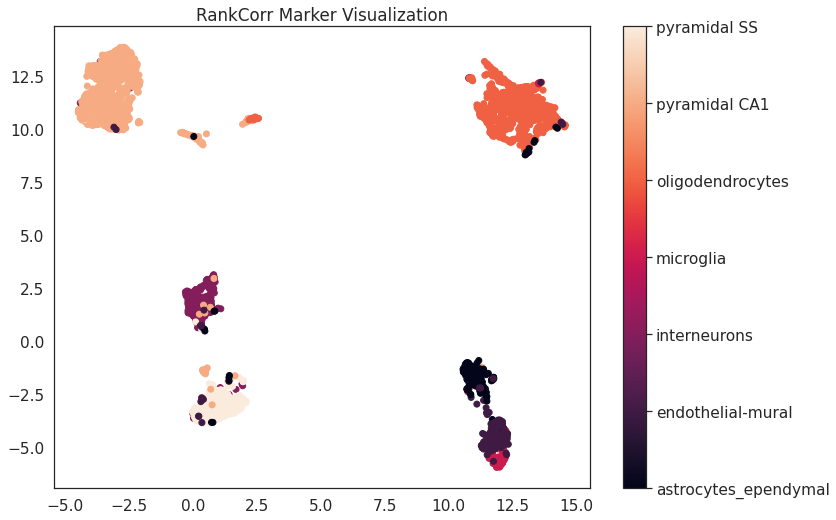

Excess Length of markers
57


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



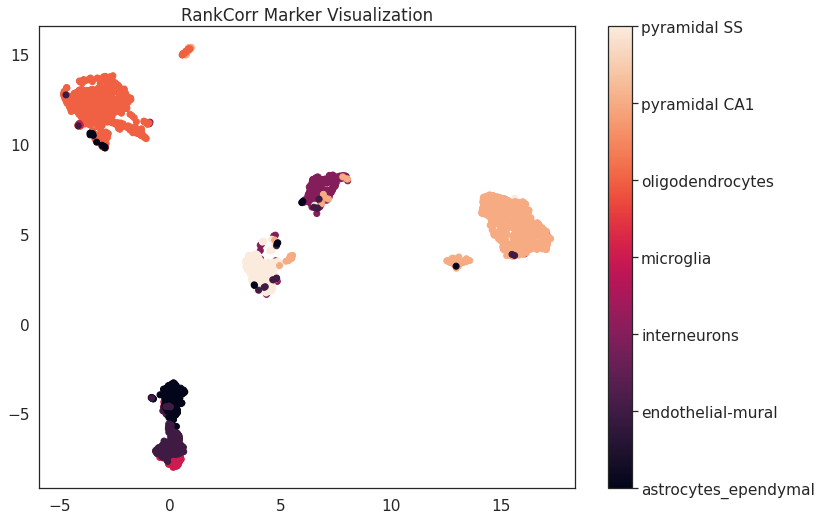

Excess Length of markers
53


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



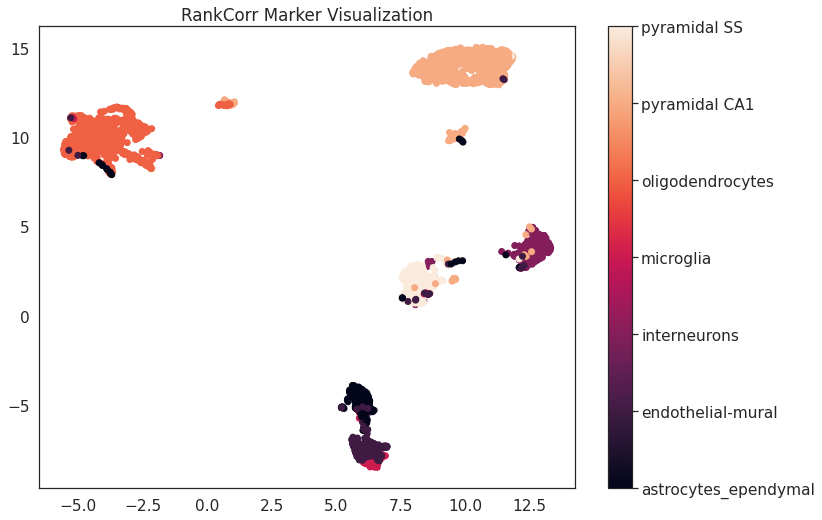

Excess Length of markers
52


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



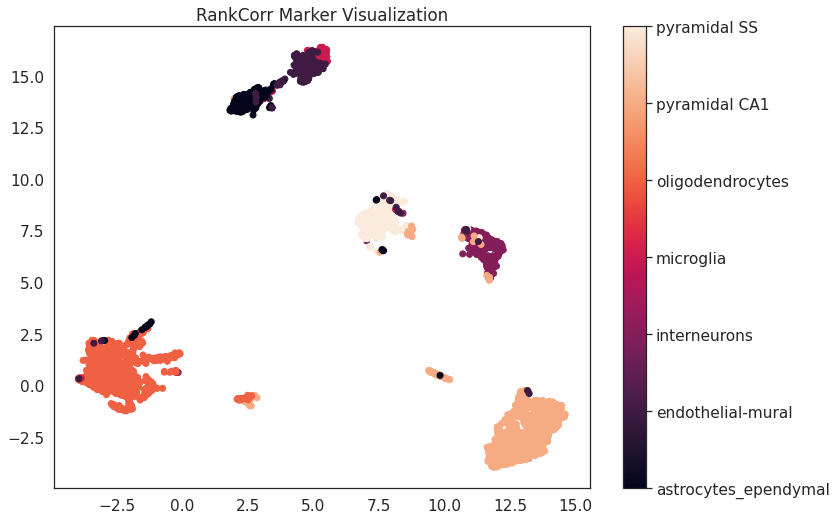

In [ ]:
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    data = Rocks(X_train, y_train)
    lamb = 4.7# this can be whatever

    rankcorr_markers = data.CSrankMarkers(lamb=lamb, writeOut=False, keepZeros=False, onlyNonZero=False)
    if len(rankcorr_markers) < k:
        raise Exception("Increase lamb for rank corr procedure")
    if len(rankcorr_markers) > k:
        print("Excess Length of markers")
        print(len(rankcorr_markers))
        rankcorr_markers = rankcorr_markers[:k]
    geneNames = np.array(adata.var.index)
    data.genes = geneNames
    marker_genes = data.markers_to_genes(rankcorr_markers)
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = rankcorr_markers)
    np.save(model_save_path + 'rankcorr_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'rankcorr_markers_{}.npy'.format(tryy), rankcorr_markers)
    np.save(model_save_path + 'experiment_data_folds/rankcorr_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'RankCorr Marker Visualization', path = viz_save_path + 'rankcorr_markers_{}.png'.format(tryy), markers = rankcorr_markers)

In [ ]:
len(rankcorr_markers)

50

In [ ]:
print("Some, if not all, selected gene names")
print(marker_genes)

Some, if not all, selected gene names
['3714', '1155', '9', '3728', '17', '2449', '19', '21', '1941', '2839', '661', '922', '2331', '28', '1053', '3999', '33', '3108', '3621', '3119', '48', '3509', '1463', '1080', '3771', '957', '3645', '64', '321', '3521', '327', '716', '2893', '3922', '3543', '2392', '89', '3418', '3290', '92', '94', '1120', '353', '3680', '1632', '2913', '3431', '106', '3948', '2544']


In [ ]:
results

(0.06489184692179706,
 {'0': {'f1-score': 0.888888888888889,
   'precision': 0.9230769230769231,
   'recall': 0.8571428571428571,
   'support': 42},
  '1': {'f1-score': 0.8505747126436781,
   'precision': 0.925,
   'recall': 0.7872340425531915,
   'support': 47},
  '2': {'f1-score': 0.9016393442622951,
   'precision': 0.873015873015873,
   'recall': 0.9322033898305084,
   'support': 59},
  '3': {'f1-score': 0.7741935483870968,
   'precision': 0.8571428571428571,
   'recall': 0.7058823529411765,
   'support': 17},
  '4': {'f1-score': 0.9636363636363636,
   'precision': 0.9578313253012049,
   'recall': 0.9695121951219512,
   'support': 164},
  '5': {'f1-score': 0.9696969696969697,
   'precision': 0.96,
   'recall': 0.9795918367346939,
   'support': 196},
  '6': {'f1-score': 0.9161290322580645,
   'precision': 0.8987341772151899,
   'recall': 0.9342105263157895,
   'support': 76},
  'accuracy': 0.9351081530782029,
  'macro avg': {'f1-score': 0.8949655513961938,
   'precision': 0.913543022

## Train L1 VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 0.0007943282347242814


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



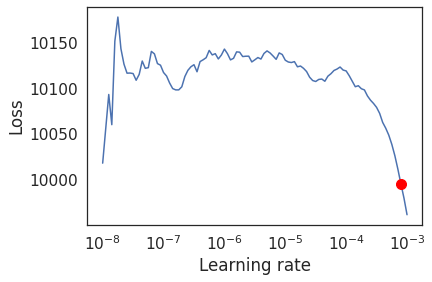

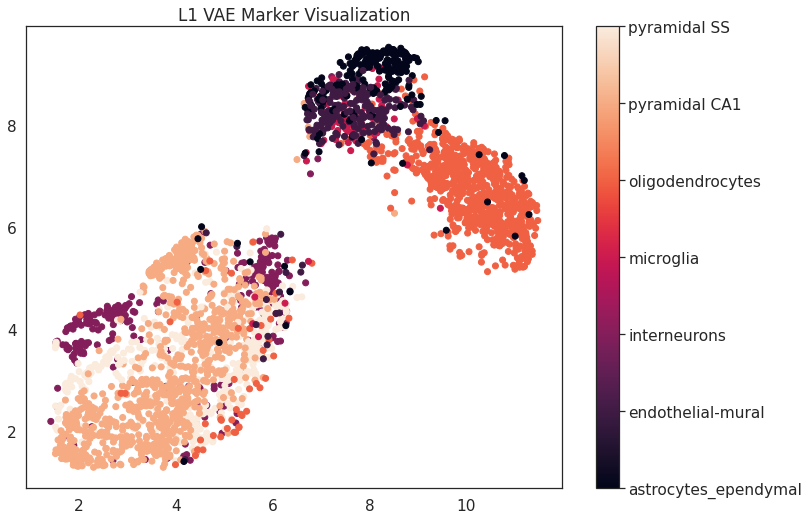

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 0.0008912509381337454


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



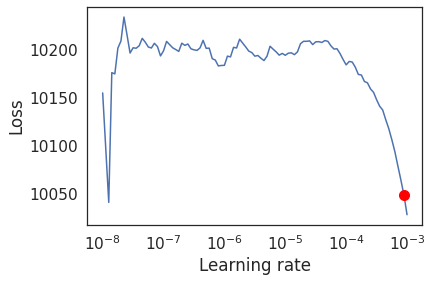

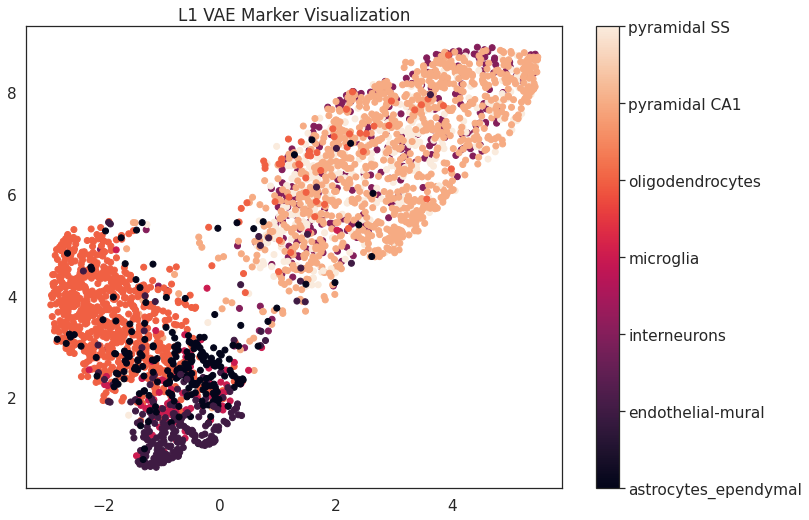

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 3.5481338923357545e-08


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



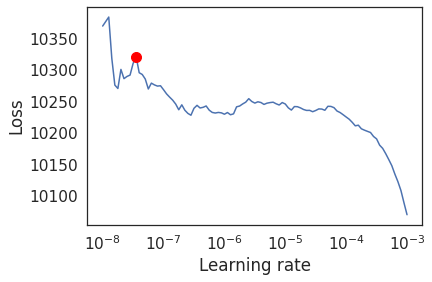

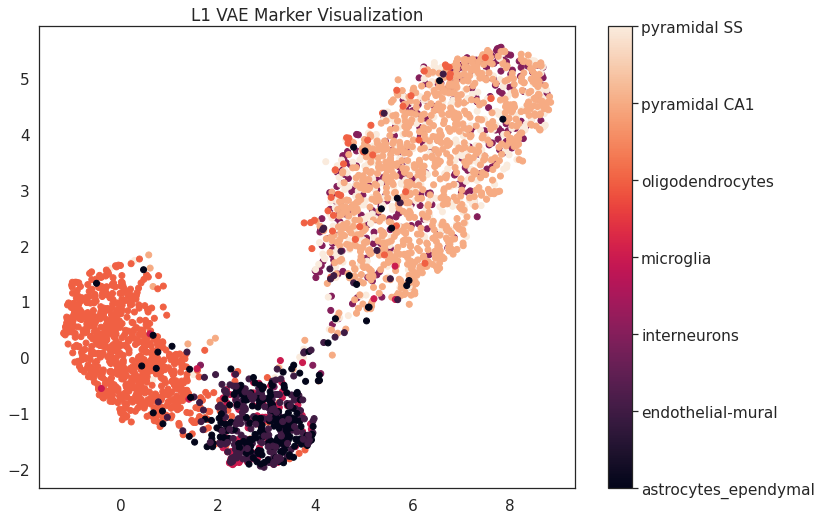

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 0.0008912509381337454


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



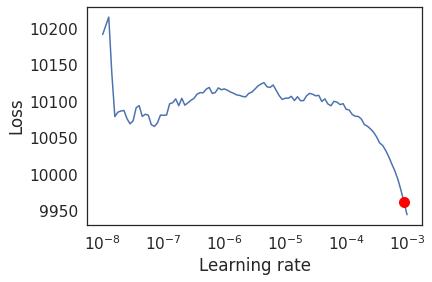

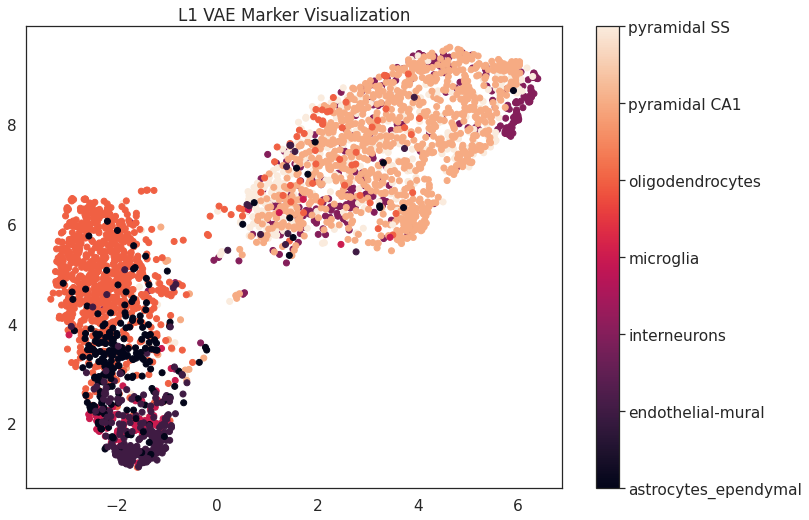

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 0.0007943282347242814


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



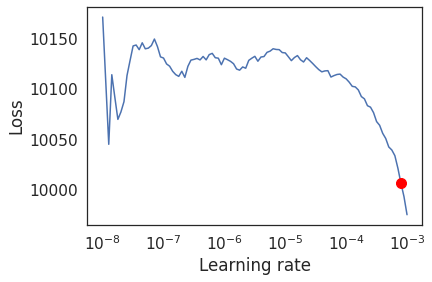

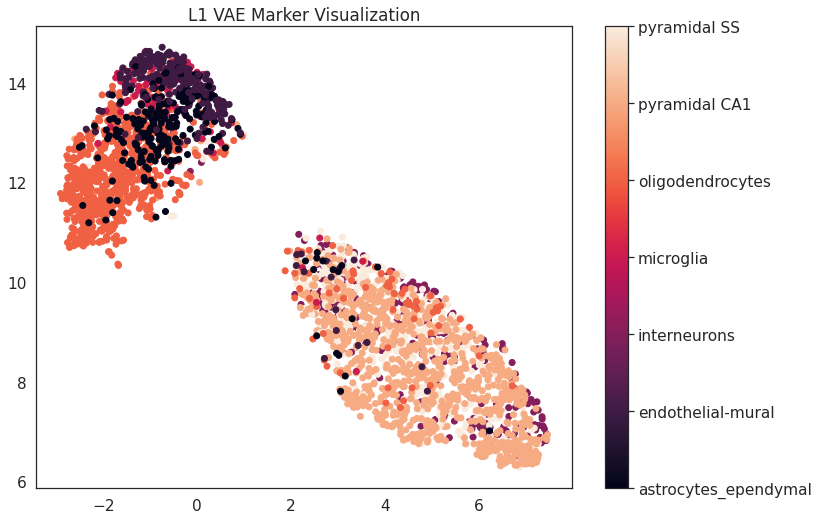

In [ ]:
feature_std = torch.tensor(X).std(dim = 0)
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_l1_diag(input_size, hidden_layer_size, z_size, batch_norm = batch_norm)
    tmp_path = model_save_path + 'l1_vae_{}.ckpt'.format(tryy)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=gpus, tpu_cores = tpu_cores, min_epochs = 25, 
                     max_epochs = 100, auto_lr = True, early_stopping_patience = 4, precision = 16)
    l1_markers = model.markers(feature_std = feature_std.to(model.device), k = k).clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = l1_markers)
    np.save(model_save_path + 'l1_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'l1_vae_markers_{}.npy'.format(tryy), l1_markers)
    np.save(model_save_path + 'experiment_data_folds/l1_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'L1 VAE Marker Visualization', path = viz_save_path + 'l1_vae_markers_{}.png'.format(tryy), markers = l1_markers)

In [ ]:
results

(0.21630615640599005,
 {'0': {'f1-score': 0.4375,
   'precision': 0.5833333333333334,
   'recall': 0.35,
   'support': 40},
  '1': {'f1-score': 0.7321428571428572,
   'precision': 0.6612903225806451,
   'recall': 0.82,
   'support': 50},
  '2': {'f1-score': 0.7301587301587301,
   'precision': 0.7931034482758621,
   'recall': 0.6764705882352942,
   'support': 68},
  '3': {'f1-score': 0.08,
   'precision': 0.16666666666666666,
   'recall': 0.05263157894736842,
   'support': 19},
  '4': {'f1-score': 0.844311377245509,
   'precision': 0.8245614035087719,
   'recall': 0.8650306748466258,
   'support': 163},
  '5': {'f1-score': 0.9090909090909092,
   'precision': 0.8706467661691543,
   'recall': 0.9510869565217391,
   'support': 184},
  '6': {'f1-score': 0.6794871794871796,
   'precision': 0.6708860759493671,
   'recall': 0.6883116883116883,
   'support': 77},
  'accuracy': 0.78369384359401,
  'macro avg': {'f1-score': 0.6303844361607407,
   'precision': 0.6529268594976857,
   'recall': 0.62

## Train Global Gate

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 1.9081000000000004e-06


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



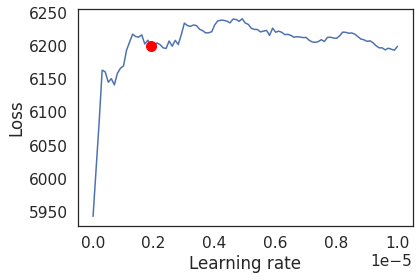

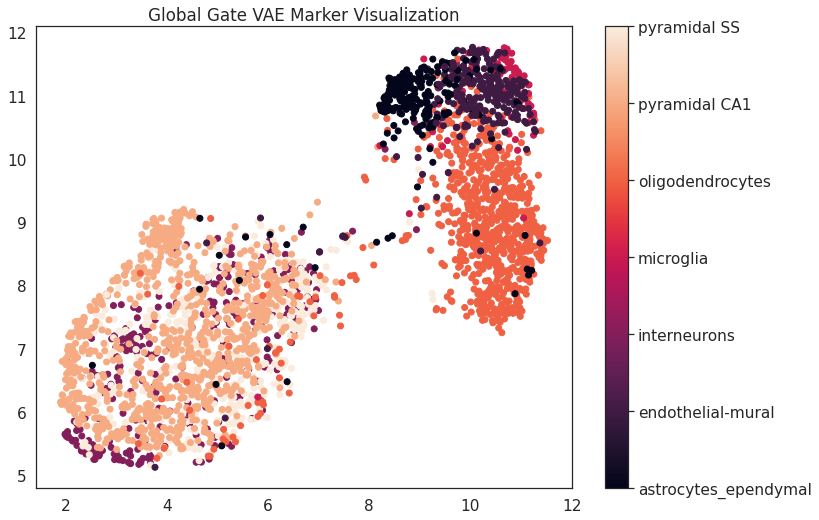

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 3.2068000000000004e-06


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



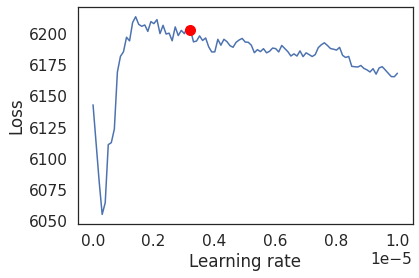

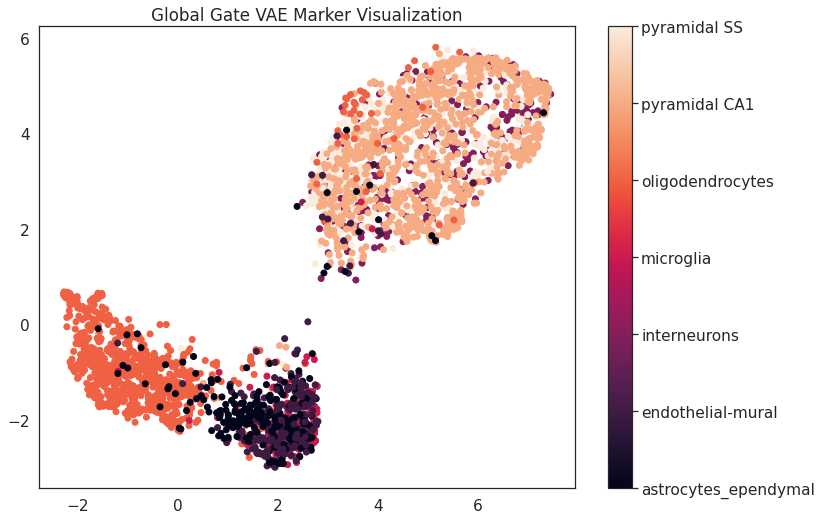

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 2.008e-06


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



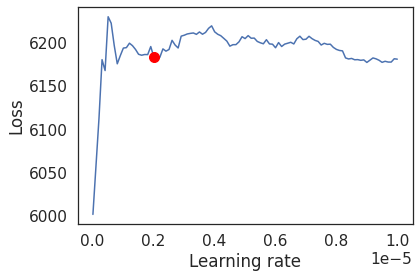

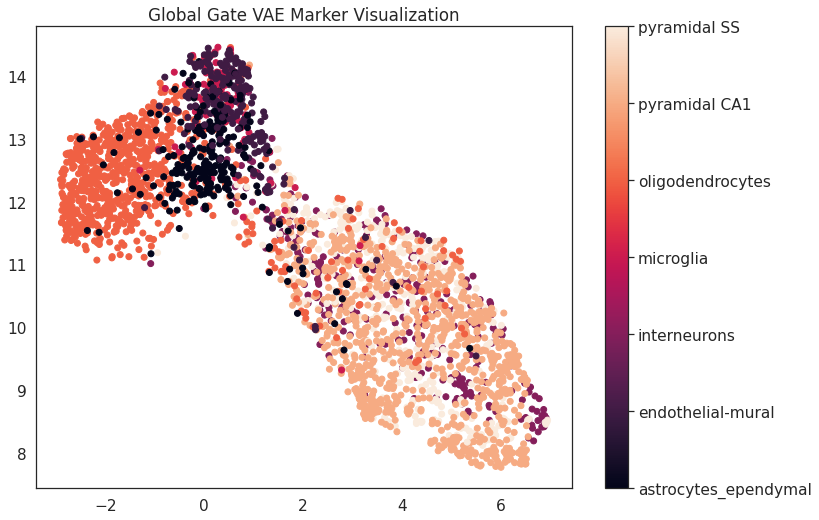

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 1.4086000000000002e-06


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



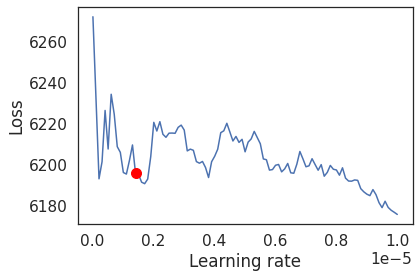

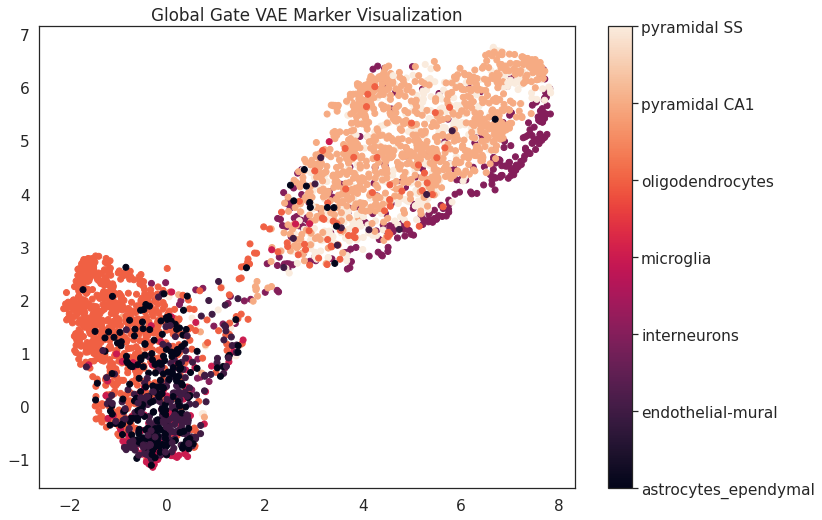

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 1.2 M 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.939    Total estimated model params size (MB)


New Learning Rate 2.1079e-06


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



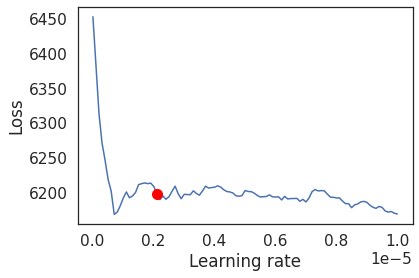

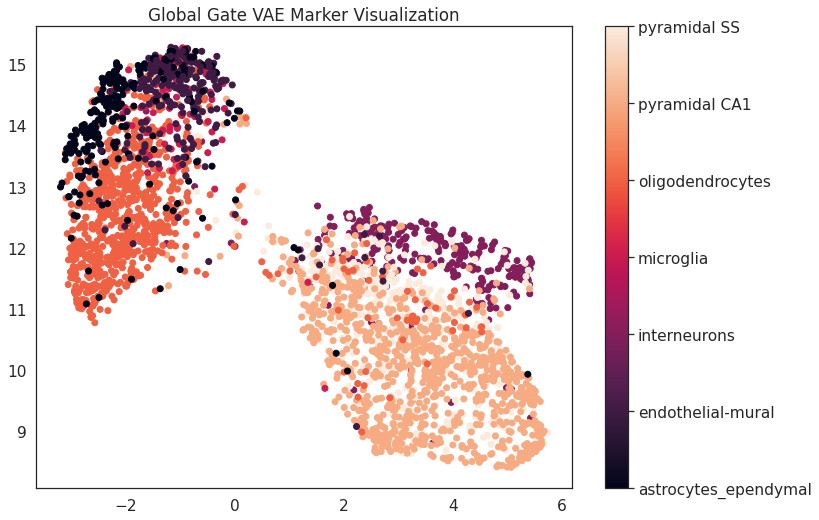

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers=num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_Gumbel_GlobalGate(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay=0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'globalgate_vae_{}.ckpt'.format(tryy)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus = gpus, tpu_cores = tpu_cores, 
                     min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.00001, early_stopping_patience =  10, 
                     lr_explore_mode = 'linear', num_lr_rates = 500, precision = 16)
    globalgate_markers = model.markers().clone().cpu().detach().numpy()
    
 
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = globalgate_markers)
    np.save(model_save_path + 'globalgate_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'globalgate_vae_markers_{}.npy'.format(tryy), globalgate_markers)
    np.save(model_save_path + 'experiment_data_folds/globalgate_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Global Gate VAE Marker Visualization', path = viz_save_path + 'globalgate_vae_markers_{}.png'.format(tryy), markers = globalgate_markers)

In [ ]:
model.t

tensor(0.0178)

In [ ]:
results

(0.17470881863560728,
 {'0': {'f1-score': 0.6153846153846154,
   'precision': 0.7142857142857143,
   'recall': 0.5405405405405406,
   'support': 37},
  '1': {'f1-score': 0.7254901960784313,
   'precision': 0.7254901960784313,
   'recall': 0.7254901960784313,
   'support': 51},
  '2': {'f1-score': 0.88,
   'precision': 0.859375,
   'recall': 0.9016393442622951,
   'support': 61},
  '3': {'f1-score': 0.2222222222222222,
   'precision': 0.42857142857142855,
   'recall': 0.15,
   'support': 20},
  '4': {'f1-score': 0.8934911242603552,
   'precision': 0.8435754189944135,
   'recall': 0.949685534591195,
   'support': 159},
  '5': {'f1-score': 0.8995215311004784,
   'precision': 0.8468468468468469,
   'recall': 0.9591836734693877,
   'support': 196},
  '6': {'f1-score': 0.6614173228346457,
   'precision': 0.84,
   'recall': 0.5454545454545454,
   'support': 77},
  'accuracy': 0.8252911813643927,
  'macro avg': {'f1-score': 0.699646715982964,
   'precision': 0.7511635149681192,
   'recall': 0.

## Train Running State VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


New Learning Rate 1.10089e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



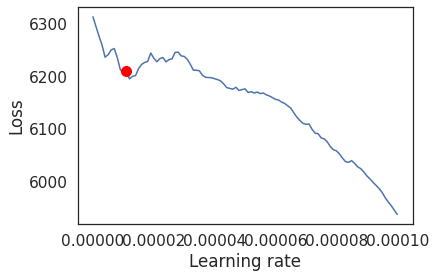

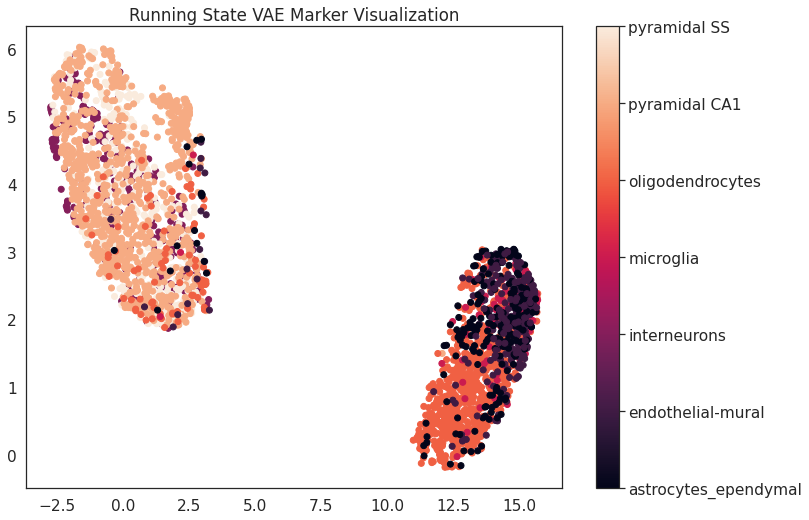

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


New Learning Rate 1.50085e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



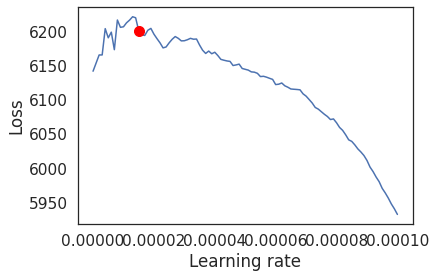

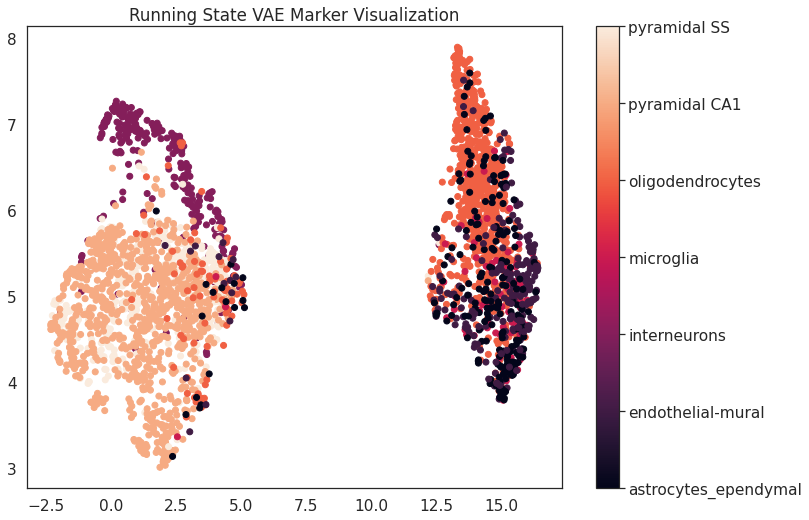

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


New Learning Rate 9.700030000000001e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



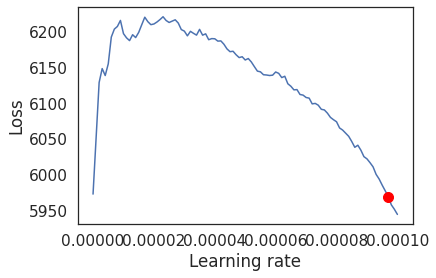

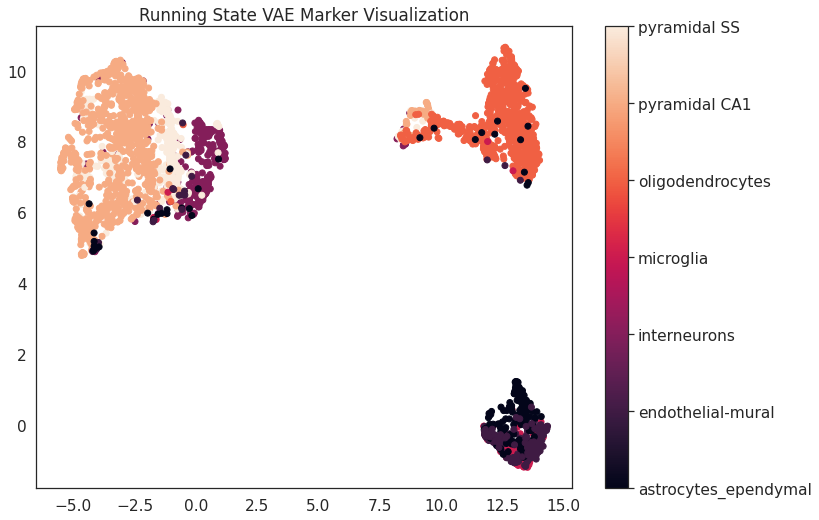

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


New Learning Rate 9.80002e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



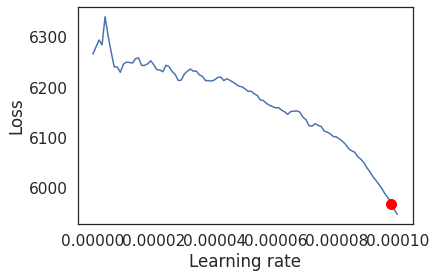

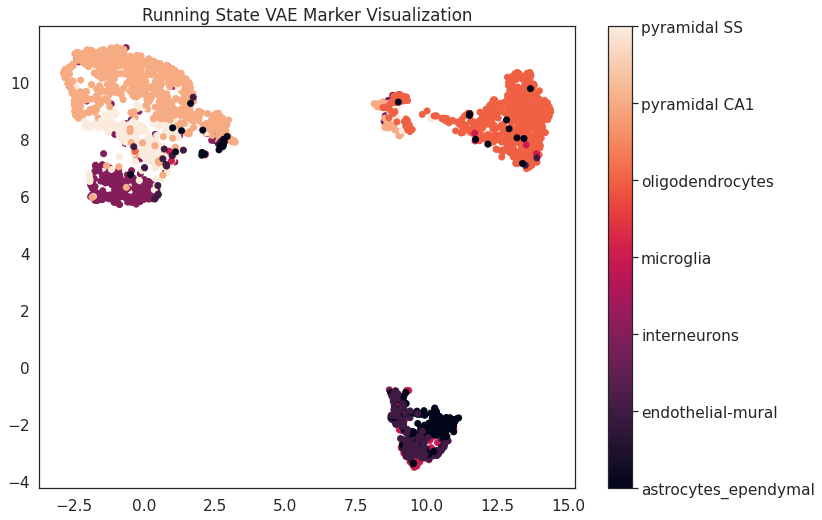

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | enc_mean       | Linear     | 4.1 K 
2 | enc_logvar     | Linear     | 4.1 K 
3 | decoder        | Sequential | 1.0 M 
4 | dec_logvar     | Sequential | 1.0 M 
5 | weight_creator | Sequential | 2.1 M 
----------------------------------------------
5.3 M     Trainable params
0         Non-trainable params
5.3 M     Total params
21.400    Total estimated model params size (MB)


New Learning Rate 2.6007400000000004e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



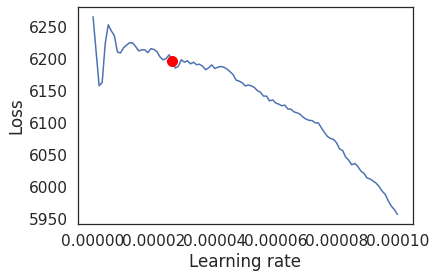

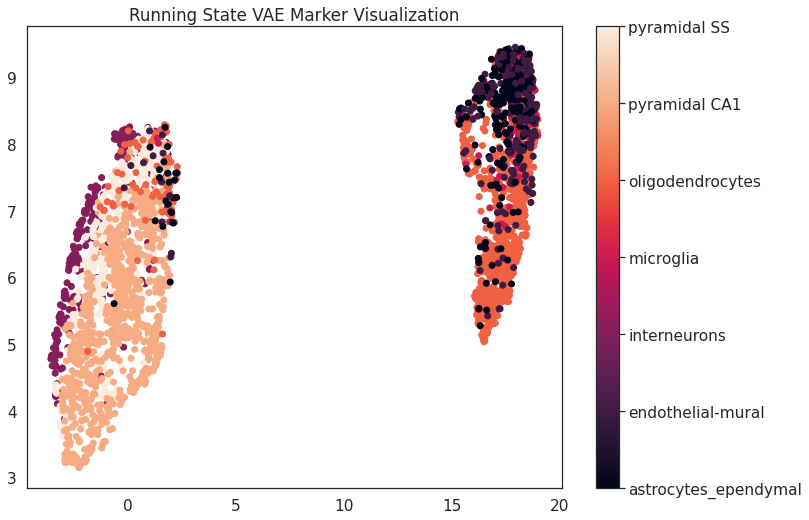

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    model = VAE_Gumbel_RunningState(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'runningstate_vae_{}.ckpt'.format(tryy)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 4, 
                     lr_explore_mode = 'linear', num_lr_rates = 500, precision = 16)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'runningstate_vae_markers_{}.npy'.format(tryy), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State VAE Marker Visualization', path = viz_save_path + 'runningstate_vae_markers_{}.png'.format(tryy), markers = runningstate_markers)

In [ ]:
model.t

tensor(0.8322)

In [ ]:
results

(0.14475873544093176,
 {'0': {'f1-score': 0.625,
   'precision': 0.7407407407407407,
   'recall': 0.5405405405405406,
   'support': 37},
  '1': {'f1-score': 0.5121951219512196,
   'precision': 0.4883720930232558,
   'recall': 0.5384615384615384,
   'support': 39},
  '2': {'f1-score': 0.9230769230769231,
   'precision': 0.9333333333333333,
   'recall': 0.9130434782608695,
   'support': 46},
  '3': {'f1-score': 0.31578947368421056,
   'precision': 0.75,
   'recall': 0.2,
   'support': 15},
  '4': {'f1-score': 0.8762886597938144,
   'precision': 0.8673469387755102,
   'recall': 0.8854166666666666,
   'support': 192},
  '5': {'f1-score': 0.9509803921568627,
   'precision': 0.9150943396226415,
   'recall': 0.9897959183673469,
   'support': 196},
  '6': {'f1-score': 0.8533333333333334,
   'precision': 0.8648648648648649,
   'recall': 0.8421052631578947,
   'support': 76},
  'accuracy': 0.8552412645590682,
  'macro avg': {'f1-score': 0.7223805577137662,
   'precision': 0.7942503300514782,
   

In [ ]:
model.t

tensor(0.8322)

## Running State Classifier

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


New Learning Rate 0.0001300087


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



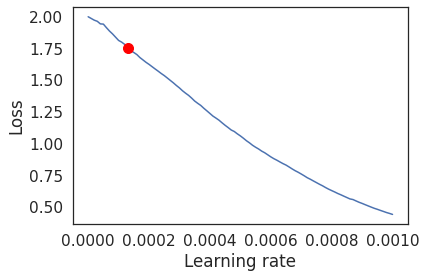

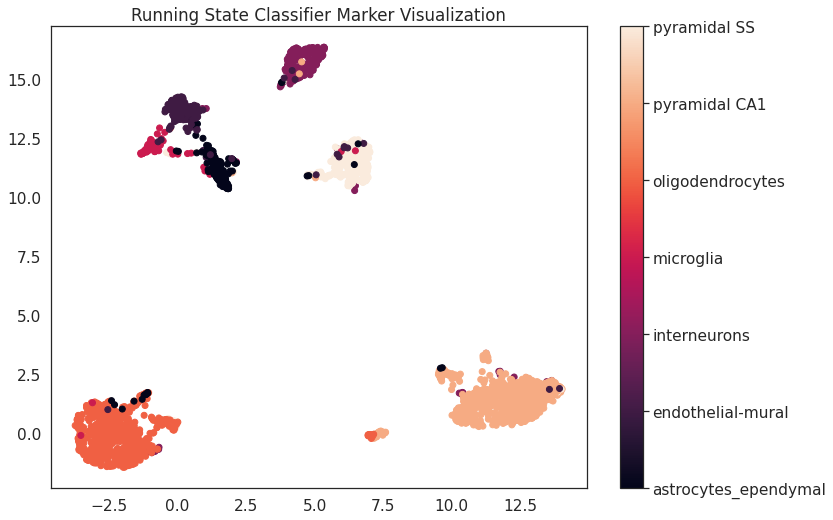

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


New Learning Rate 0.0003800062


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



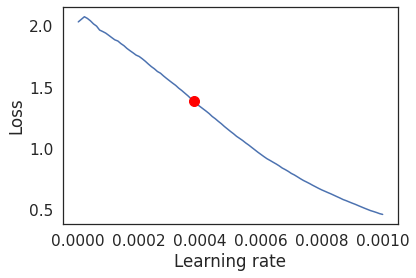

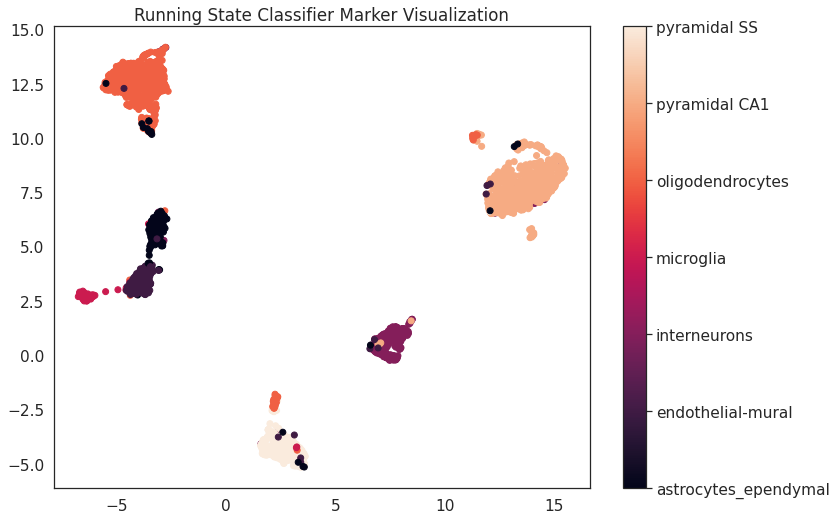

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


New Learning Rate 0.0003800062


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



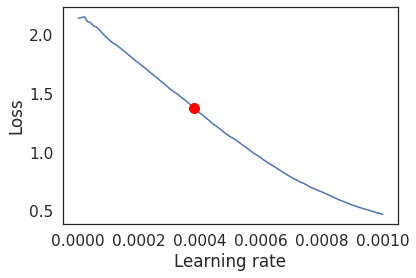

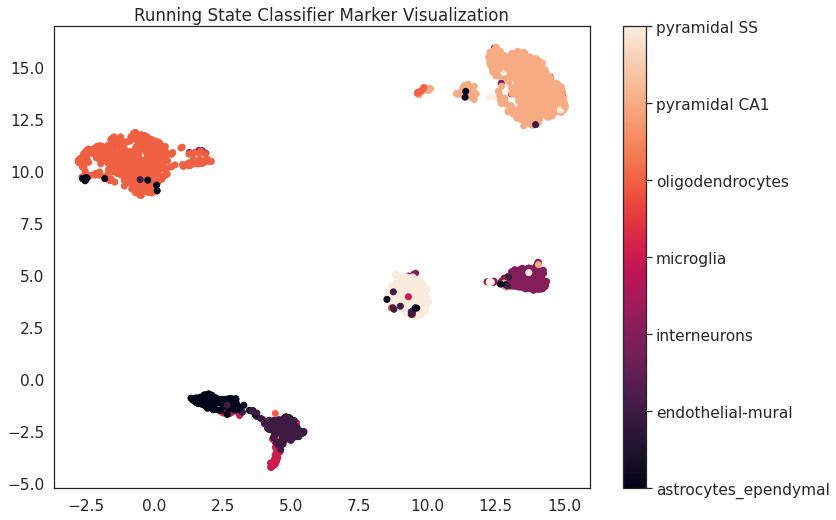

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


New Learning Rate 0.00033000670000000006


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



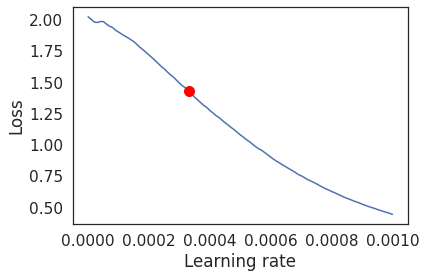

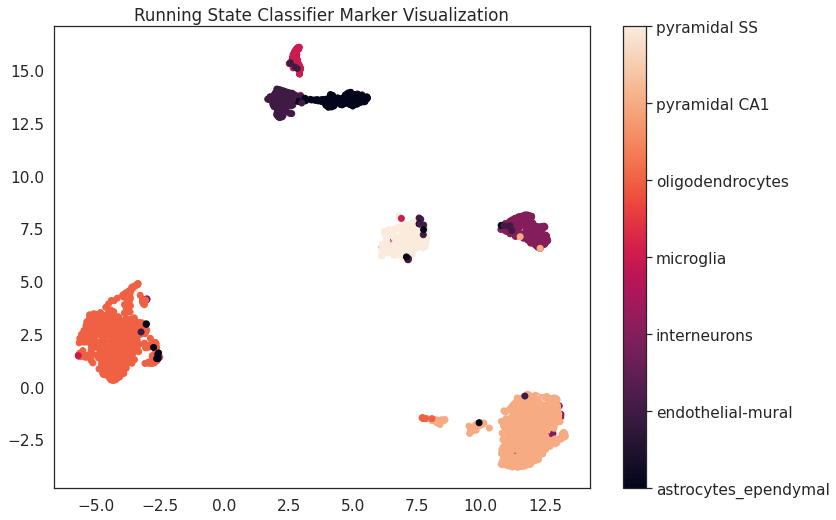

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 1.2 M 
1 | decoder        | Sequential | 6.7 K 
2 | weight_creator | Sequential | 2.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.147    Total estimated model params size (MB)


New Learning Rate 0.0001600084


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



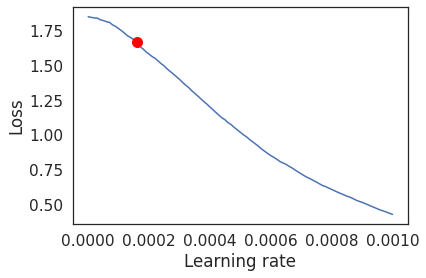

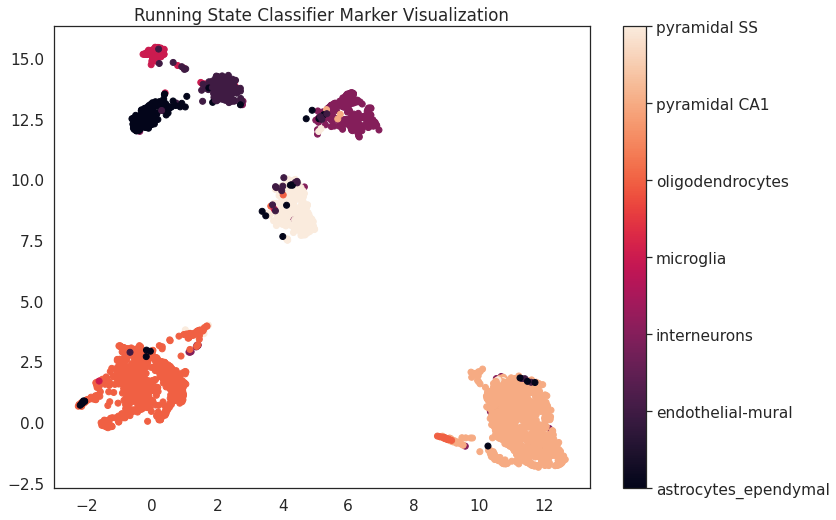

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    
    model = GumbelClassifier(input_size, hidden_layer_size, z_size, num_classes = len(encoder.classes_), 
                             k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'runningstate_classifier_{}.ckpt'.format(tryy)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=gpus, tpu_cores = tpu_cores, 
                     min_epochs = 25, max_epochs = 100, auto_lr = True, early_stopping_patience = 3, precision = 16, lr_explore_mode = 'linear', num_lr_rates=500)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_classifier_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'runningstate_classifier_markers_{}.npy'.format(tryy), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_classifier_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State Classifier Marker Visualization', path = viz_save_path + 'runningstate_classifier_markers_{}.png'.format(tryy), markers = runningstate_markers)

In [ ]:
model.lr

0.0001600084

In [ ]:
model.t

tensor(0.8322)

In [ ]:
model.hparams.lr

0.0001600084

In [ ]:
results

(0.04159733777038266,
 {'0': {'f1-score': 0.9010989010989011,
   'precision': 0.9534883720930233,
   'recall': 0.8541666666666666,
   'support': 48},
  '1': {'f1-score': 0.9278350515463918,
   'precision': 0.9375,
   'recall': 0.9183673469387755,
   'support': 49},
  '2': {'f1-score': 0.9090909090909091,
   'precision': 0.9433962264150944,
   'recall': 0.8771929824561403,
   'support': 57},
  '3': {'f1-score': 0.9387755102040817,
   'precision': 0.92,
   'recall': 0.9583333333333334,
   'support': 24},
  '4': {'f1-score': 0.9847094801223242,
   'precision': 0.9817073170731707,
   'recall': 0.9877300613496932,
   'support': 163},
  '5': {'f1-score': 0.9746192893401014,
   'precision': 0.9504950495049505,
   'recall': 1.0,
   'support': 192},
  '6': {'f1-score': 0.955223880597015,
   'precision': 0.9696969696969697,
   'recall': 0.9411764705882353,
   'support': 68},
  'accuracy': 0.9584026622296173,
  'macro avg': {'f1-score': 0.941621860285675,
   'precision': 0.9508977049690298,
   'r

## Concrete VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


New Learning Rate 2.9007100000000002e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



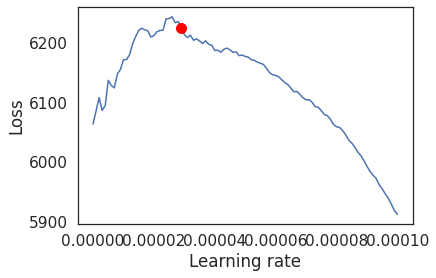

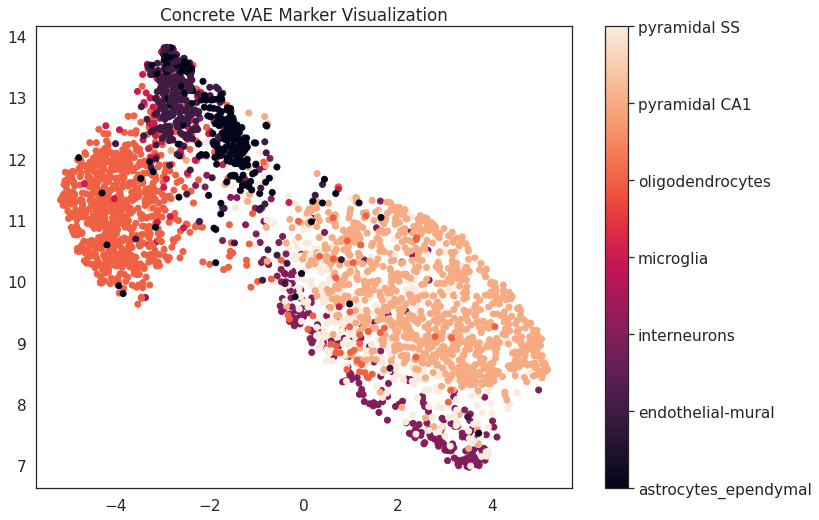

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


New Learning Rate 1.10089e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



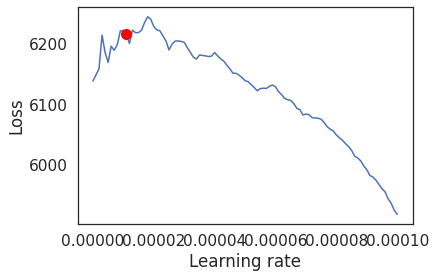

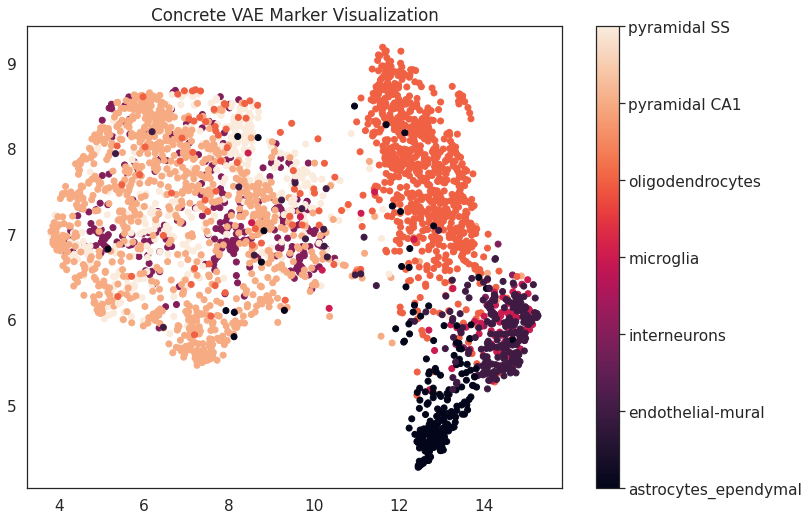

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


New Learning Rate 1.50085e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



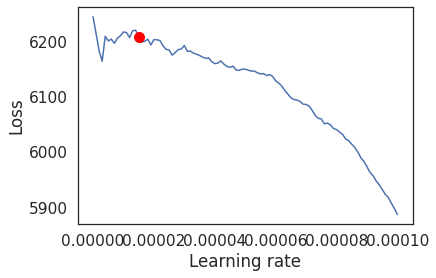

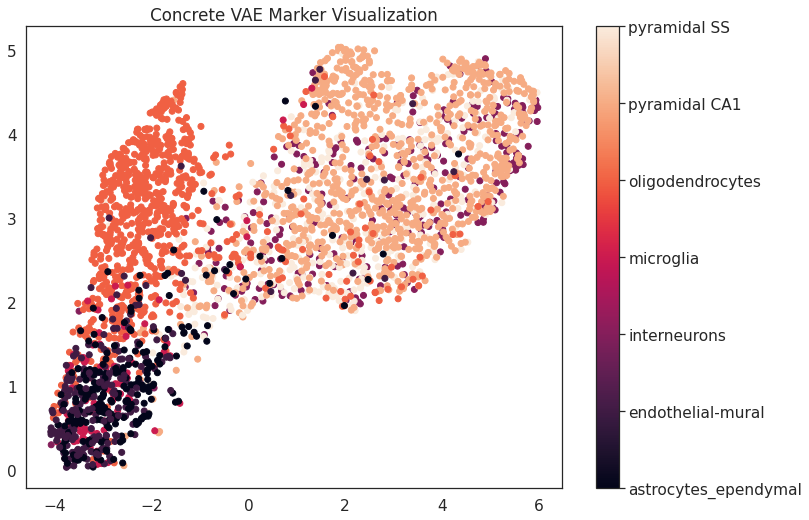

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


New Learning Rate 1.10089e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



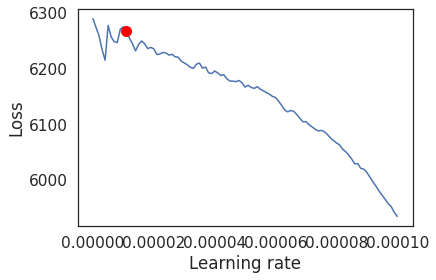

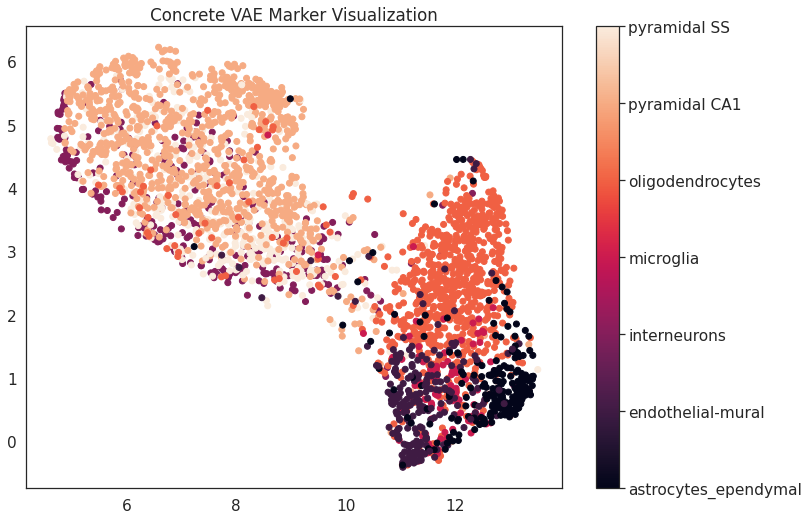

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 145 K 
1 | enc_mean   | Linear     | 4.1 K 
2 | enc_logvar | Linear     | 4.1 K 
3 | decoder    | Sequential | 1.0 M 
4 | dec_logvar | Sequential | 1.0 M 
------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.678     Total estimated model params size (MB)


New Learning Rate 9.90001e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



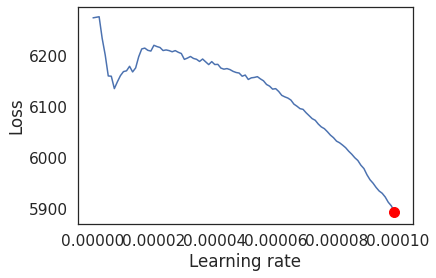

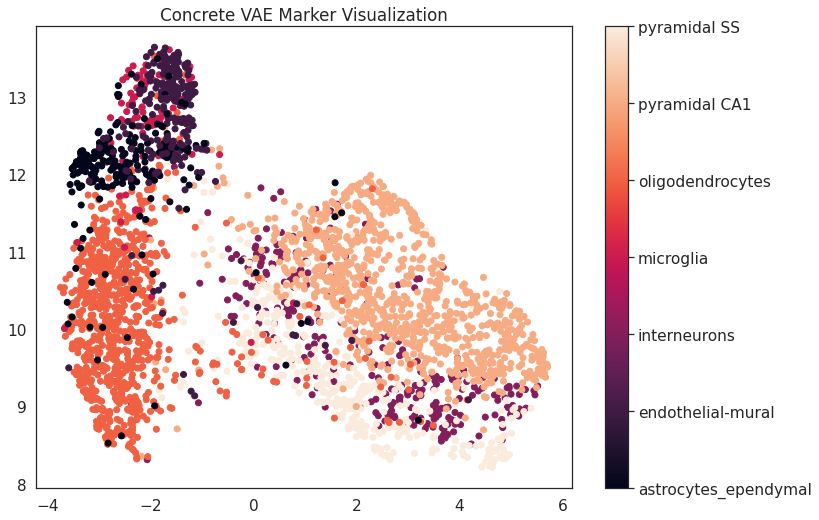

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = ConcreteVAE_NMSL(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay = 0.9, batch_norm = batch_norm)
    tmp_path = model_save_path + 'concrete_vae_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 3, 
                     lr_explore_mode = 'linear', num_lr_rates = 500, precision = 16)
    concrete_vae_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = concrete_vae_markers)
    np.save(model_save_path + 'concrete_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'concrete_vae_markers_{}.npy'.format(tryy), concrete_vae_markers)
    np.save(model_save_path + 'experiment_data_folds/concrete_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Concrete VAE Marker Visualization', path = viz_save_path + 'concrete_vae_markers_{}.png'.format(tryy), markers = concrete_vae_markers)

In [ ]:
results = np.load(model_save_path + 'concrete_vae_results_{}.npy'.format(1), allow_pickle = True)

In [ ]:
results

array([0.17138103161397666,
       {'0': {'precision': 0.8095238095238095, 'recall': 0.8095238095238095, 'f1-score': 0.8095238095238095, 'support': 42}, '1': {'precision': 0.7358490566037735, 'recall': 0.8478260869565217, 'f1-score': 0.7878787878787878, 'support': 46}, '2': {'precision': 0.8085106382978723, 'recall': 0.7169811320754716, 'f1-score': 0.76, 'support': 53}, '3': {'precision': 0.75, 'recall': 0.2727272727272727, 'f1-score': 0.39999999999999997, 'support': 22}, '4': {'precision': 0.9, 'recall': 0.9473684210526315, 'f1-score': 0.9230769230769231, 'support': 171}, '5': {'precision': 0.8502415458937198, 'recall': 0.9214659685863874, 'f1-score': 0.8844221105527639, 'support': 191}, '6': {'precision': 0.671875, 'recall': 0.5657894736842105, 'f1-score': 0.6142857142857142, 'support': 76}, 'accuracy': 0.8286189683860233, 'macro avg': {'precision': 0.7894285786170251, 'recall': 0.7259545949437578, 'f1-score': 0.7398839064739997, 'support': 601}, 'weighted avg': {'precision': 0.82289

## Get Model Metrics from KNNs Classifiers


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
def generate_metrics_from_saved_files(X, y, folds_path, markers_path, classifier_model, save_path):
    train_indices, val_indices, test_indices = np.load(folds_path, allow_pickle = True)
    markers = np.load(markers_path, allow_pickle = True)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices, :]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = markers, model = classifier_model)

    np.save(save_path, results)
    return

def batch_generate_metrics_from_saved_files(X, y, format_folds_path, format_markers_path, format_save_path):
    for tryy in range(1, num_times+1):
        classifier_model = KNeighborsClassifier()
        generate_metrics_from_saved_files(X, y, format_folds_path.format(tryy), format_markers_path.format(tryy), classifier_model, format_save_path.format(tryy))
    return

In [ ]:
batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/l1_vae_indices_{}.npy',
                                  model_save_path+'l1_vae_markers_{}.npy',
                                  model_save_path+'l1_vae_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/smash_rf_indices_{}.npy',
                                  model_save_path+'smash_rf_markers_{}.npy',
                                  model_save_path+'smash_rf_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/smash_indices_{}.npy',
                                  model_save_path+'smash_markers_{}.npy',
                                  model_save_path+'smash_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/rankcorr_indices_{}.npy',
                                  model_save_path+'rankcorr_markers_{}.npy',
                                  model_save_path+'rankcorr_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/globalgate_vae_indices_{}.npy',
                                  model_save_path+'globalgate_vae_markers_{}.npy',
                                  model_save_path+'globalgate_vae_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/runningstate_vae_indices_{}.npy',
                                  model_save_path+'runningstate_vae_markers_{}.npy',
                                  model_save_path+'runningstate_vae_knn_results_{}.npy')


batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/runningstate_classifier_indices_{}.npy',
                                  model_save_path+'runningstate_classifier_markers_{}.npy',
                                  model_save_path+'runningstate_classifier_knn_results_{}.npy')

batch_generate_metrics_from_saved_files(X, y,
                                  model_save_path+'experiment_data_folds/concrete_vae_indices_{}.npy',
                                  model_save_path+'concrete_vae_markers_{}.npy',
                                  model_save_path+'concrete_vae_knn_results_{}.npy')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

# Results and Visualizations

## Accuracies and F1

In [ ]:
result_axis = [
 ('L1 VAE', 'l1_vae_results_{}.npy', 'l1_vae_knn_results_{}.npy'),
 ('Smash RF', 'smash_rf_results_{}.npy', 'smash_rf_knn_results_{}.npy'),
 ('SMaSH DNN', 'smash_results_{}.npy', 'smash_knn_results_{}.npy'),
 ('RankCorr', 'rankcorr_results_{}.npy', 'rankcorr_knn_results_{}.npy'),
 ('Global Gate VAE', 'globalgate_vae_results_{}.npy', 'globalgate_vae_knn_results_{}.npy'),
 ('RunningGumbel VAE', 'runningstate_vae_results_{}.npy', 'runningstate_vae_knn_results_{}.npy'),
 ('RunningGumbel Classifier', 'runningstate_classifier_results_{}.npy', 'runningstate_classifier_knn_results_{}.npy'),
 ('Concrete VAE',  'concrete_vae_results_{}.npy', 'concrete_vae_knn_results_{}.npy')
]

In [ ]:
data_proto = []
indices = []
for axis in result_axis: 
    data_proto.append(model_variances(model_save_path + axis[1], num_times))
    indices.append(axis[0])

In [ ]:
pd.DataFrame(data_proto, index = indices, 
             columns = ['Misclassification Mean', 'Weighted F1 Mean', 'Misclassification Standard Deviation', 'Weighted F1 Standard Deviation'])

,Misclassification Mean,Weighted F1 Mean,Misclassification Standard Deviation,Weighted F1 Standard Deviation
L1 VAE,0.198003,0.785078,0.043947,0.053930
Smash RF,0.051913,0.947360,0.002662,0.002875
SMaSH DNN,0.065557,0.933201,0.002901,0.002985
RankCorr,0.053245,0.946112,0.006226,0.006405
Global Gate VAE,0.192679,0.795044,0.040585,0.044356
RunningGumbel VAE,0.096506,0.897779,0.014391,0.015763
RunningGumbel Classifier,0.047255,0.952098,0.002257,0.002450
Concrete VAE,0.187022,0.801334,0.040561,0.044358


In [ ]:
data_proto = []
indices = []
for axis in result_axis: 
    data_proto.append(model_variances(model_save_path + axis[2], num_times))
    indices.append(axis[0])

In [ ]:
pd.DataFrame(data_proto, index = indices, 
             columns = ['Misclassification Mean', 'Weighted F1 Mean', 'Misclassification Standard Deviation', 'Weighted F1 Standard Deviation'])

,Misclassification Mean,Weighted F1 Mean,Misclassification Standard Deviation,Weighted F1 Standard Deviation
L1 VAE,0.252912,0.735159,0.031763,0.035751
Smash RF,0.054243,0.945190,0.007987,0.008147
SMaSH DNN,0.067221,0.931306,0.005219,0.005535
RankCorr,0.055574,0.943303,0.007704,0.008015
Global Gate VAE,0.277537,0.707185,0.052904,0.054816
RunningGumbel VAE,0.120133,0.875926,0.029228,0.030135
RunningGumbel Classifier,0.036606,0.963114,0.001823,0.001896
Concrete VAE,0.272879,0.712116,0.058431,0.062063


## Confusion Matrices

k = 50

In [ ]:
# https://www.kaggle.com/grfiv4/plot-a-confusion-matrix
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          save_path = None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()


k = 50

### Smash RF

In [ ]:
results =  np.load(model_save_path + 'smash_rf_results_{}.npy'.format(1), allow_pickle = True)

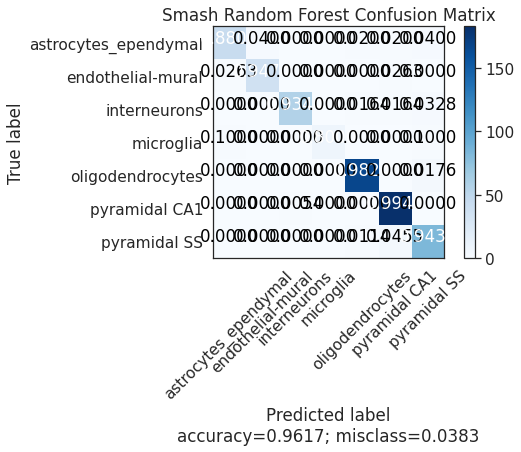

In [ ]:
plot_confusion_matrix(results[2], encoder.classes_, title = 'Smash Random Forest Confusion Matrix', save_path = viz_save_path + 'smash_rf_cm.png')

### RankCorr

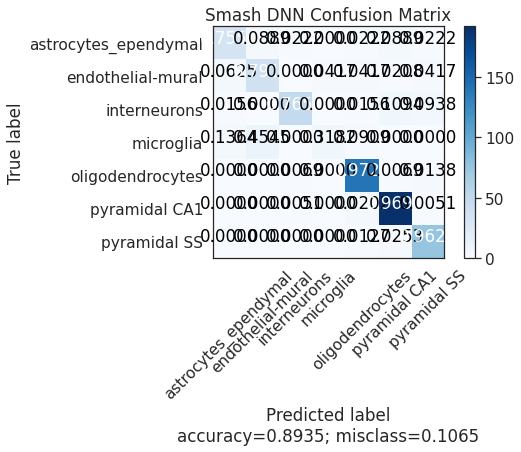

In [ ]:
results =  np.load(model_save_path + 'smash_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Smash DNN Confusion Matrix', save_path = viz_save_path + 'smash_dnn_cm.png')

### L1 VAE

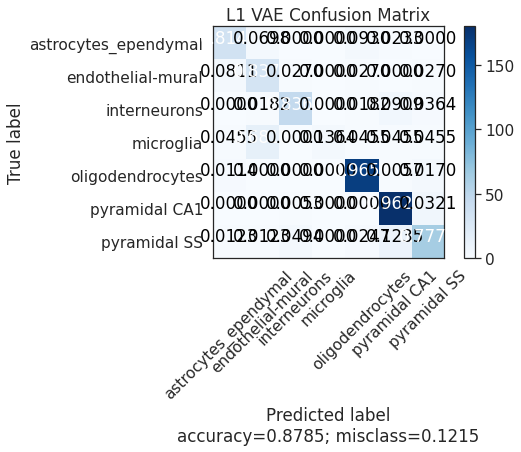

In [ ]:
results =  np.load(model_save_path + 'l1_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'L1 VAE Confusion Matrix', save_path = viz_save_path + 'l1_vae_cm.png')

### Global Gate VAE

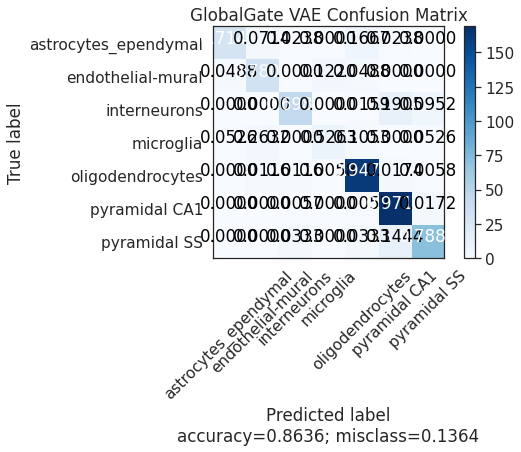

In [ ]:
results =  np.load(model_save_path + 'globalgate_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'GlobalGate VAE Confusion Matrix', save_path = viz_save_path + 'globalgate_vae_cm.png')

### Running Gumbel VAE

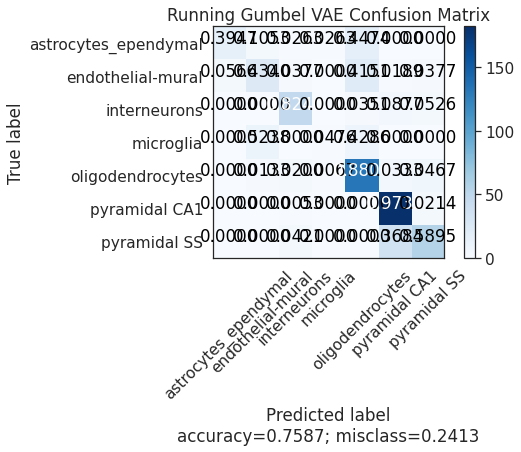

In [ ]:
results =  np.load(model_save_path + 'runningstate_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Running Gumbel VAE Confusion Matrix', save_path = viz_save_path + 'runningstate_vae_cm.png')

### Running Gumbel Classifier


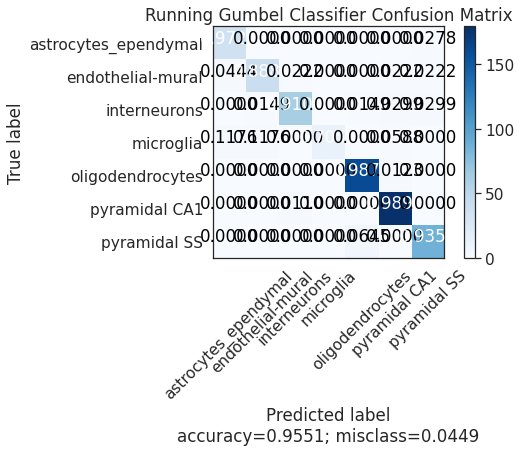

In [ ]:
results =  np.load(model_save_path + 'runningstate_classifier_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Running Gumbel Classifier Confusion Matrix', save_path = viz_save_path + 'runningstate_classifier_cm.png')

### Concrete VAE

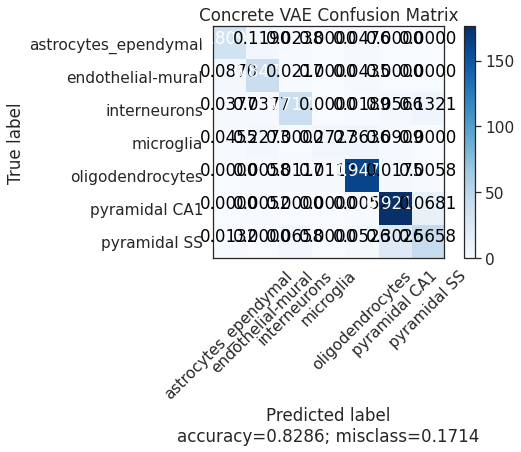

In [ ]:
results =  np.load(model_save_path + 'concrete_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Concrete VAE Confusion Matrix', save_path = viz_save_path + 'concrete_vae_cm.png')

## UMap Visualization

In [ ]:
import cv2

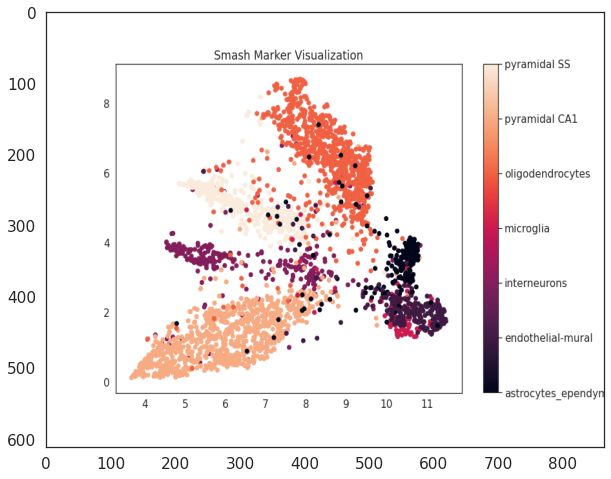

In [ ]:
img = cv2.imread(viz_save_path + 'smash_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

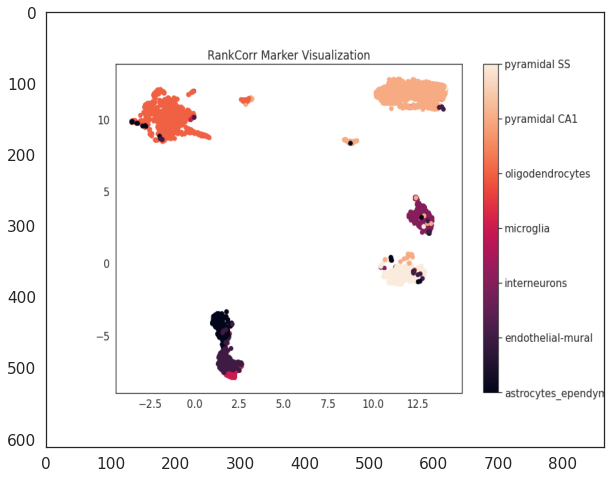

In [ ]:
img = cv2.imread(viz_save_path + 'rankcorr_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')

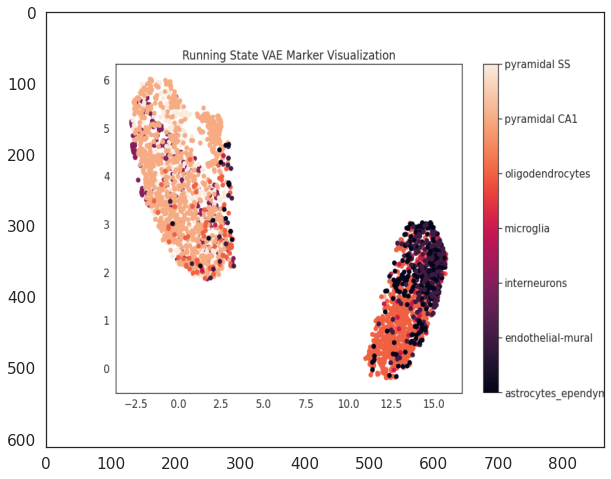

In [ ]:
img = cv2.imread(viz_save_path + 'runningstate_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

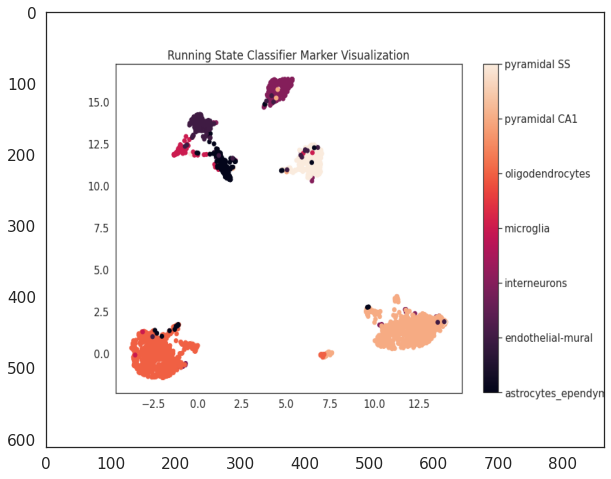

In [ ]:
img = cv2.imread(viz_save_path + 'runningstate_classifier_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

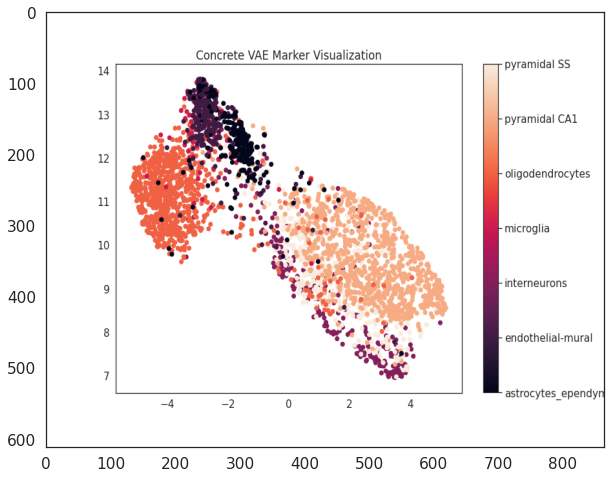

In [ ]:
img = cv2.imread(viz_save_path + 'concrete_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

## Visualizing Reconstructions

from first model of each

## L1 VAE

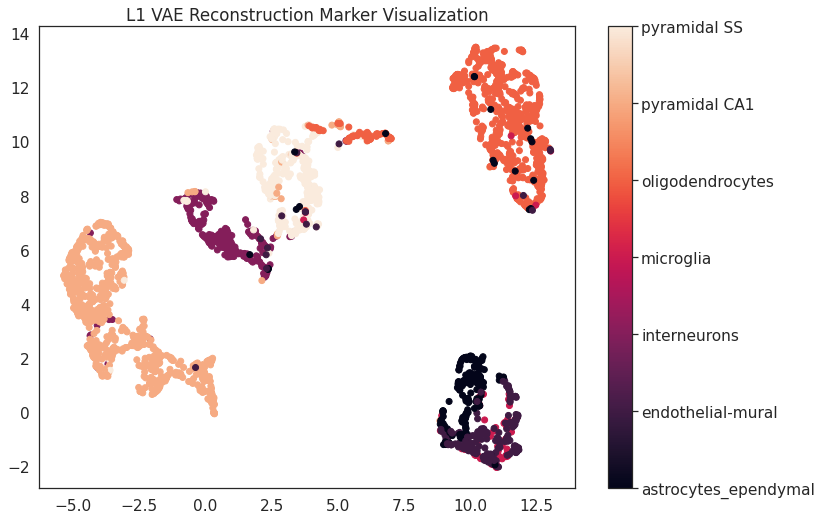

In [ ]:
model = load_model(VAE_l1_diag, model_save_path + 'l1_vae_{}.ckpt'.format(1))
l1_vae_markers = np.load(model_save_path + 'l1_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'L1 VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_l1_vae_{}.png'.format(1), markers = l1_vae_markers)

### Global Gate VAE

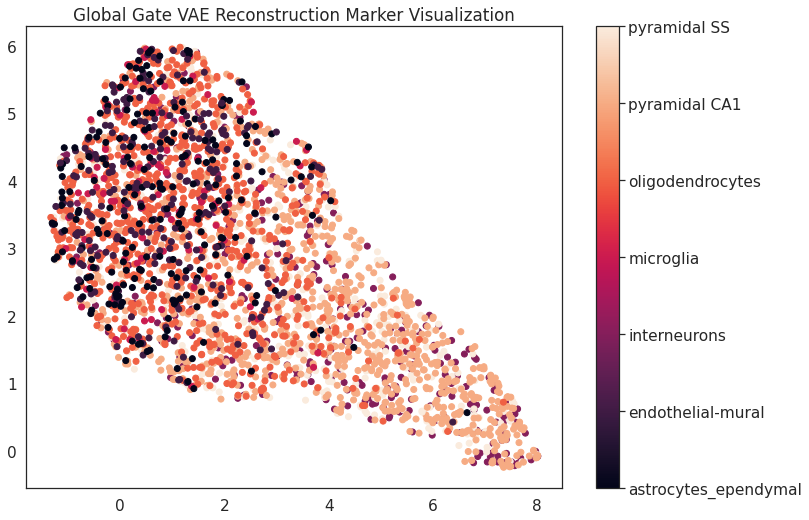

In [ ]:
model = load_model(VAE_Gumbel_GlobalGate, model_save_path + 'globalgate_vae_{}.ckpt'.format(1))
globalgate_vae_markers = np.load(model_save_path + 'globalgate_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Global Gate VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_globalgate_vae_{}.png'.format(1), markers = globalgate_vae_markers)

### Running State Gumbel VAE

In [ ]:
model = load_model(VAE_Gumbel_RunningState, model_save_path + 'runningstate_vae_{}.ckpt'.format(1))


In [ ]:
runningstate_vae_markers = np.load(model_save_path + 'runningstate_vae_markers_{}.npy'.format(1), allow_pickle=True)

In [ ]:
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]

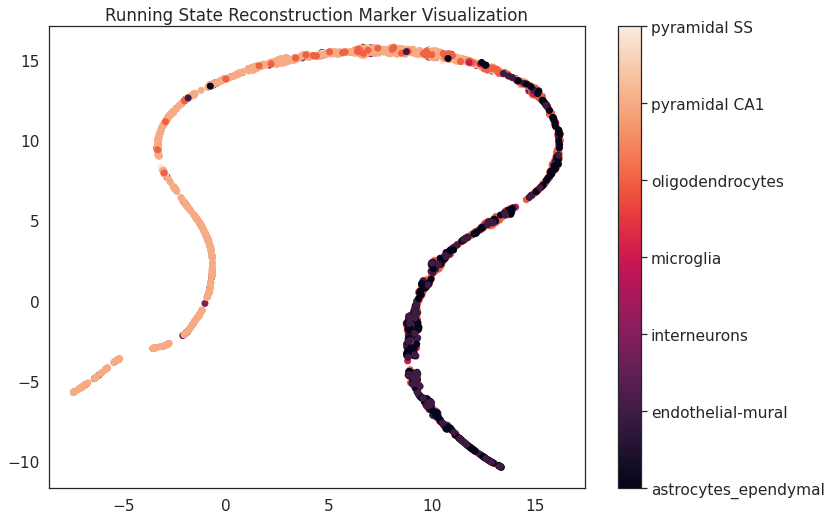

In [ ]:
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Running State Reconstruction Marker Visualization', path = viz_save_path + 'recon_runningstate_vae_{}.png'.format(1), markers = runningstate_vae_markers)

Concrete VAE

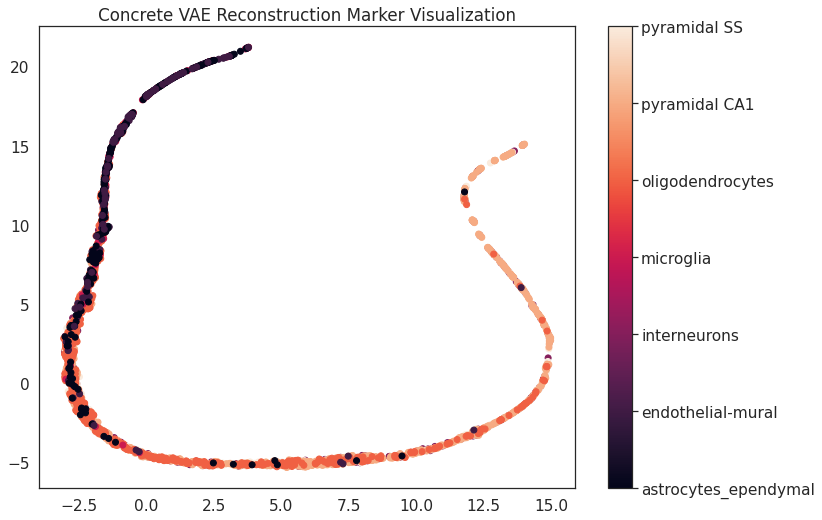

In [ ]:
model = load_model(ConcreteVAE_NMSL, model_save_path + 'concrete_vae_{}.ckpt'.format(1))
concrete_vae_markers = np.load(model_save_path + 'concrete_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Concrete VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_concrete_vae_{}.png'.format(1), markers = concrete_vae_markers)

# Things to note for paper

PySmash uses a seed internally so the model is deterministic to a particular dataset. We used various different train seeds, whereas the smash paper uses the whole dataset for the data.

For smash DNN, to select the markers, I had to use all the data. Couldn't just use train and val set.